In [1]:
%load_ext autoreload
%autoreload 2
from IPython.display import clear_output
import os
import fnmatch
import numpy as np
import pickle
import matplotlib.pyplot as plt
import umap
from sklearn.mixture import GaussianMixture
from scipy import stats

from scipy.stats import zscore

plt.rcParams['figure.figsize'] = (5.0, 5.0)
plt.rcParams.update({'font.size': 12})
plt.rcParams.update(plt.rcParamsDefault)

np.random.seed(seed=11)


cwd = os.getcwd()

if cwd.split("/")[1] == "export":
    data_dir = "../../../files_from_snuffy"
else:
    data_dir = "../../../data_GRS1915"

    
from numpy.random import multivariate_normal
from scipy.spatial.distance import mahalanobis
from scipy.spatial.distance import euclidean
from sklearn.decomposition import PCA

In [2]:
# !for pid in `pgrep -f jupyter`; do { ps -u -p $pid; }; done

USER       PID %CPU %MEM    VSZ   RSS TTY      STAT START   TIME COMMAND
jakubok   1512  1.2  0.2 865824 208744 ?       SNsl 11:59   0:06 /export/data/ja
USER       PID %CPU %MEM    VSZ   RSS TTY      STAT START   TIME COMMAND
jakubok   6267 44.0  0.0   4500   692 pts/35   SNs+ 12:08   0:00 /bin/sh -c for 
USER       PID %CPU %MEM    VSZ   RSS TTY      STAT START   TIME COMMAND
jakubok  11467  0.2  0.2 998176 223312 ?       SNl  Jun16  24:29 /export/data/ja
USER       PID %CPU %MEM    VSZ   RSS TTY      STAT START   TIME COMMAND
jakubok  34190  0.0  0.0 185772 49328 ?        SNl  Jun15   0:01 /export/data/ja


In [3]:
# !for pid in `pgrep -f jupyter`; do { renice 5 $pid; }; done

1512 (process ID) old priority 5, new priority 5
6431 (process ID) old priority 5, new priority 5
11467 (process ID) old priority 5, new priority 5
34190 (process ID) old priority 5, new priority 5


In [ ]:
# !stat -c '%y' OPTICS_shape16_moments4_max_eps4_min_samp500_euclidean_alldata.pkl
# 2020-06-22 01:46:51.500058368 +0100

# Load data

In [2]:
with open('{}/468202_len128_s2_4cad_counts_errorfix.pkl'.format(data_dir), 'rb') as f:
    segments_counts = pickle.load(f)
# with open('../../../data_GRS1915/468202_len128_s2_4cad_errors_errorfix.pkl', 'rb') as f:
#     segments_errors = pickle.load(f)
# with open('../../../data_GRS1915/468202_len128_s2_4cad_ids_errorfix.pkl', 'rb') as f:
#     id_per_seg = pickle.load(f)

weights_dir = "../../../model_weights/model_2020-04-29_09-12-23.h5"
segments_dir = '../../../data_GRS1915/468202_len128_s2_4cad_counts_errorfix.pkl'
segment_encoding_dir = '{}/segment_encoding_{}_segments_{}.pkl'.format(data_dir, weights_dir.split("/")[-1].split(".")[0], segments_dir.split("/")[-1].split(".")[0])

with open(segment_encoding_dir, 'rb') as f:
    segment_encoding = pickle.load(f)
    
segment_encoding_scaled_means = zscore(segment_encoding[:,0,:], axis=0).astype(np.float32)  # standardize per feature


desc_stats = np.zeros((len(segments_counts), 4)) #mean, std, skew, kurt
# desc_stats[:,0] = np.median(segments_counts, axis=1).flatten()
desc_stats[:,0] = np.mean(segments_counts, axis=1).flatten()
desc_stats[:,1] = np.std(segments_counts, axis=1).flatten()
desc_stats[:,2] = stats.skew(segments_counts, axis=1).flatten()
desc_stats[:,3] = stats.kurtosis(segments_counts, axis=1).flatten()
zscore_desc_stats = zscore(desc_stats, axis=0)

# desc_GM = np.hstack((zscore(desc_stats, axis=0), GMM_bics))

shape_moments = np.hstack((segment_encoding_scaled_means, zscore_desc_stats)) # every column is standardized

# Calculate component descriptors

In [3]:
with open("{}/shape16_moments4_components114_alldata.pkl".format(data_dir), 'rb') as f:
    clf_GM114 = pickle.load(f)

eig_vals, eig_vecs = np.linalg.eig(clf_GM114.covariances_) # shapes: (114, 20) and (114, 20, 20)
means = clf_GM114.means_
covs = clf_GM114.covariances_

/export/data/jakubok/software/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.mixture.gaussian_mixture module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.mixture. Anything that cannot be imported from sklearn.mixture is now part of the private API.
  warnings.warn(message, FutureWarning)
/export/data/jakubok/software/anaconda3/lib/python3.7/site-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator GaussianMixture from version 0.19.2 when using version 0.22.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [4]:
shape_moments_GM114_labels = clf_GM114.predict(shape_moments)

In [12]:
# shape_moments_GM114_proba = clf_GM114.predict_proba(shape_moments)
# with open('{}/shape_moments_GM114_proba.pkl'.format(data_dir), 'wb') as f:
#     pickle.dump(shape_moments_GM114_proba, f)

In [ ]:
from scipy.special import gamma
import pandas as pd

n=20
component_vol_members_density = np.zeros((114, 3)) # volume, number of assigned data points and density of each component


for comp in range(114):
    component_vol_members_density[comp,0] = (np.pi**(n/2)/gamma(n/2+1))*np.product(np.sqrt(eig_vals[comp])*3) # volume
    component_vol_members_density[comp,1] = np.unique(shape_moments_GM114_labels, return_counts=1)[1][comp] # number of points
    component_vol_members_density[comp,2] = component_vol_members_density[comp,1]/component_vol_members_density[comp,0] # number of points per unit volume

component_vol_members_density_df = pd.DataFrame(component_vol_members_density, columns=("volume", "members", "density"))
component_vol_members_density_df

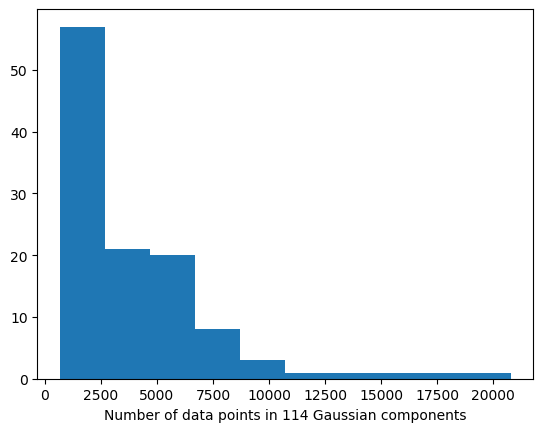

In [28]:
plt.hist(component_vol_members_density_df.members.values)#, bins=np.logspace(np.log10(1e-2),np.log10(1e15), 20))
# plt.gca().set_xscale("log")
# plt.xlim([1e-2,1e15])
plt.xlabel("Number of data points in 114 Gaussian components")
plt.show()

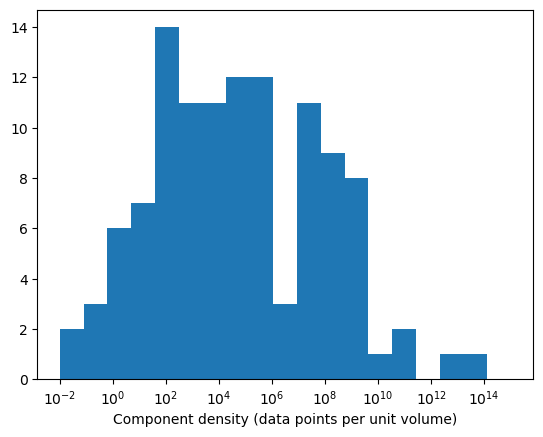

In [45]:
plt.hist(component_vol_members_density_df.density.values, bins=np.logspace(np.log10(1e-2),np.log10(1e15), 20))
plt.gca().set_xscale("log")
# plt.xlim([1e-2,1e15])
plt.xticks([10**x for x in [-2,0,2,4,6,8,10,12,14]])
plt.xlabel("Component density (data points per unit volume)")
plt.show()

In [ ]:
plt.hist(component_vol_members_density_df.volume.values, bins=np.logspace(np.log10(1e-11),np.log10(1e6), 20))
plt.gca().set_xscale("log")
# plt.xlim([1e-2,1e15])
plt.xlabel("Component volume")
plt.show()

In [290]:
samples_coords

array([[[ 0.34002618, -0.53701797, -0.66851135, ...,  0.79798985,
         -0.25069918, -0.41842908],
        [-0.58940333,  0.06350772,  0.31337965, ...,  2.65386   ,
         -0.32953062, -0.92672811],
        [ 1.5811247 ,  0.18708746,  0.45447232, ...,  2.83135585,
          0.34883277, -0.90927126],
        ...,
        [ 1.22307178,  1.35304505,  0.57664259, ...,  0.49327285,
          1.2296512 ,  0.83931258],
        [ 0.16373037,  0.02329097,  0.5588478 , ...,  2.64993854,
          0.75028365, -0.42310385],
        [ 1.09115859,  0.06354722,  1.03587614, ...,  1.60312791,
          0.82802155, -0.46866467]],

       [[ 0.23305684, -0.6867064 ,  0.5865714 , ...,  2.39241007,
         -0.10923251, -0.54961315],
        [ 0.0659086 ,  0.52817857,  0.33510357, ...,  2.13741945,
         -0.62432264, -0.76233472],
        [-0.46452354, -0.10728157,  0.45163724, ...,  1.19241942,
         -0.88199143, -1.13479313],
        ...,
        [ 0.85794532,  0.81445525,  0.22309437, ...,  

In [291]:

#find density of each component in terms of training data
#sample from each compoent

#compare i and j components' densities, and only poceed if they're within a factor of 2

#for each component i
#find mahalanobis distances to the component mean
#find the furthest (mahalanbis) 1% of points from the mean

#for each component j
#find mahalanobis distance of the furthest 1% of points from the mean
#if any of the 1% of j points are closer to the mean of i than any of the 1% of i points, then merge


#find the euclidean distances between furthest 1% of i and 1% of j



samples_coords = np.zeros((114,100000,20)) # coordinates sampled from two Gaussian components

for comp1_ind in range(114): # populate the array
    samples_coords[comp1_ind,:,:] = multivariate_normal(mean=means[comp1_ind], cov=covs[comp1_ind], size=100000)

    
merge = []
    
    
for comp1_ind, comp1_samples in enumerate(samples_coords):
    comp1_density = component_vol_members_density_df.density.values[comp1_ind]
    
    mahalanobis_func = lambda sample: mahalanobis(sample, means[comp1_ind], np.linalg.inv(covs[comp1_ind]))
    mahal_mapper = map(mahalanobis_func, comp1_samples) # euclidean distance calculation
    mahal_dists=np.array(list(mahal_mapper)) 
    
#     comp1_max_dist = np.min(np.sort(mahal_dists)[-30:]) # 0.3% distance (~3sigma)
    comp1_max_dist=np.max(mahal_dists)
#     comp1_1cent = comp1_samples[np.argsort(mahal_dists)[-1000:]]
    
    for comp2_ind, comp2_samples in enumerate(samples_coords):
        if comp1_ind == comp2_ind: continue
        
        comp2_density = component_vol_members_density_df.density.values[comp2_ind]
        
        if (comp2_density > comp1_density*2.5) or (comp2_density < comp1_density/2.5): continue
            
        mahalanobis_func = lambda sample: mahalanobis(sample, means[comp2_ind], np.linalg.inv(covs[comp2_ind]))
        mahal_mapper = map(mahalanobis_func, comp2_samples) # euclidean distance calculation
        mahal_dists=np.array(list(mahal_mapper)) 
    
        comp2_1cent = comp2_samples[np.argsort(mahal_dists)[-1000:]]
        
        mahalanobis_func = lambda sample: mahalanobis(sample, means[comp1_ind], np.linalg.inv(covs[comp1_ind]))
        mahal_mapper = map(mahalanobis_func, comp2_1cent) # euclidean distance calculation
        mahal_dists_2to1 =np.array(list(mahal_mapper)) 
        
        if np.min(mahal_dists_2to1) < comp1_max_dist:
            merge.append((comp1_ind,comp2_ind))
            
        print([comp1_ind,comp2_ind])
        clear_output(wait=True)
        
# with open('{}/GaussianMixture114_mergers_2p5density.pkl'.format(data_dir), 'wb') as f:
#     pickle.dump(merge, f)
        
# with open('{}/GaussianMixture114_mergers_2.pkl'.format(data_dir), 'wb') as f:
#     pickle.dump(merge, f)


KeyboardInterrupt: 

In [ ]:
'{}/GaussianMixture114_mergers.pkl'.format(data_dir)
'{}/GaussianMixture114_mergers_lax_dist.pkl'.format(data_dir)# comp1_max_dist = np.max(mahal_dists)
'{}/GaussianMixture114_mergers_lax_dens.pkl'.format(data_dir)# factor of 5
'{}/GaussianMixture114_mergers_lax_dist_dens.pkl'.format(data_dir)

In [292]:
with open('{}/GaussianMixture114_mergers_2.pkl'.format(data_dir), 'rb') as f:
    merge = pickle.load(f)

In [ ]:
eig_vals, eig_vecs = np.linalg.eig(clf_GM114.covariances_) # shapes: (114, 20) and (114, 20, 20)


In [293]:
#https://stackoverflow.com/questions/4842613/merge-lists-that-share-common-elements

l = merge
out = []
while len(l)>0:
    first, *rest = l
    first = set(first)

    lf = -1
    while len(first)>lf:
        lf = len(first)

        rest2 = []
        for r in rest:
            if len(first.intersection(set(r)))>0:
                first |= set(r)
            else:
                rest2.append(r)     
        rest = rest2

    out.append(first)
    l = rest

remaining_components = []
for i in range(114):
    if not any(i in sublist for sublist in out):
        remaining_components.append(i)
        
new_components = []
for i in range(len(out)):
    new_components.append(list(out[i]))
    
for i in remaining_components:
    new_components.append([i])
    
print(new_components)

compssum=0
for i in new_components:
    compssum +=len(i)
compssum

print("Sum of included components (should be 114): ", compssum)

new_labels = []
for label in shape_moments_GM114_labels:
    for comp_ind, comp in enumerate(new_components):
        if label in comp:
            new_labels.append(comp_ind)
            break

print("no. of new labels (should be 468202):", len(new_labels))

np.unique(new_labels, return_counts=1)

[[0, 6], [32, 1, 64, 67, 100, 4, 104, 106, 75, 42, 113, 82, 84, 89, 90], [3, 5, 69, 10, 76, 13, 15, 91, 28, 96, 36, 37, 103, 40, 44, 112, 53, 57, 60], [99, 72, 9, 46, 81, 87, 93], [33, 35, 71, 41, 59, 11, 14, 17, 83, 52, 24, 27, 94, 95], [18, 45], [97, 50, 19], [20, 77], [22, 56, 74, 63], [25, 85], [88, 47], [98, 68, 101, 70, 80, 55, 92], [65, 107], [108, 110], [2], [7], [8], [12], [16], [21], [23], [26], [29], [30], [31], [34], [38], [39], [43], [48], [49], [51], [54], [58], [61], [62], [66], [73], [78], [79], [86], [102], [105], [109], [111]]
Sum of included components (should be 114):  114
no. of new labels (should be 468202): 468202


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]),
 array([  9035,  62021, 150457,  32093,  60727,   4191,   8185,   3533,
         10763,   4088,   3081,  24735,   3066,   2680,   1740,  17500,
          2274,   2650,   6547,   2646,   1761,   1233,   2443,   1713,
          2870,   1613,   2998,   1524,   1567,   2374,   1745,   2261,
          1683,   1737,   2637,   2498,    727,   3599,   1692,   3642,
          2054,   2435,   1909,   5388,   2087]))

In [303]:
# component_vol_members_density_df.iloc[[shape_moments_GM114_labels[10]]

component_vol_members_density_df.iloc[[ 32, 1, 64, 67, 100, 4, 104, 106, 75, 42, 113, 82, 84, 89, 90]]


,volume,members,density,origin_dist
32,20.516158,5934.0,289.235447,2.616254
1,7.430632,2439.0,328.235880,3.655114
64,30.764859,9034.0,293.646718,1.838105
67,46.810139,5578.0,119.162219,2.190478
100,76.617165,4048.0,52.834113,1.801514
4,19.231138,2467.0,128.281539,2.427792
104,34.099656,2874.0,84.282375,3.546882
106,36.167539,2404.0,66.468443,3.989452
75,19.265733,2196.0,113.984763,3.283474
42,19.239293,2532.0,131.605666,4.231998


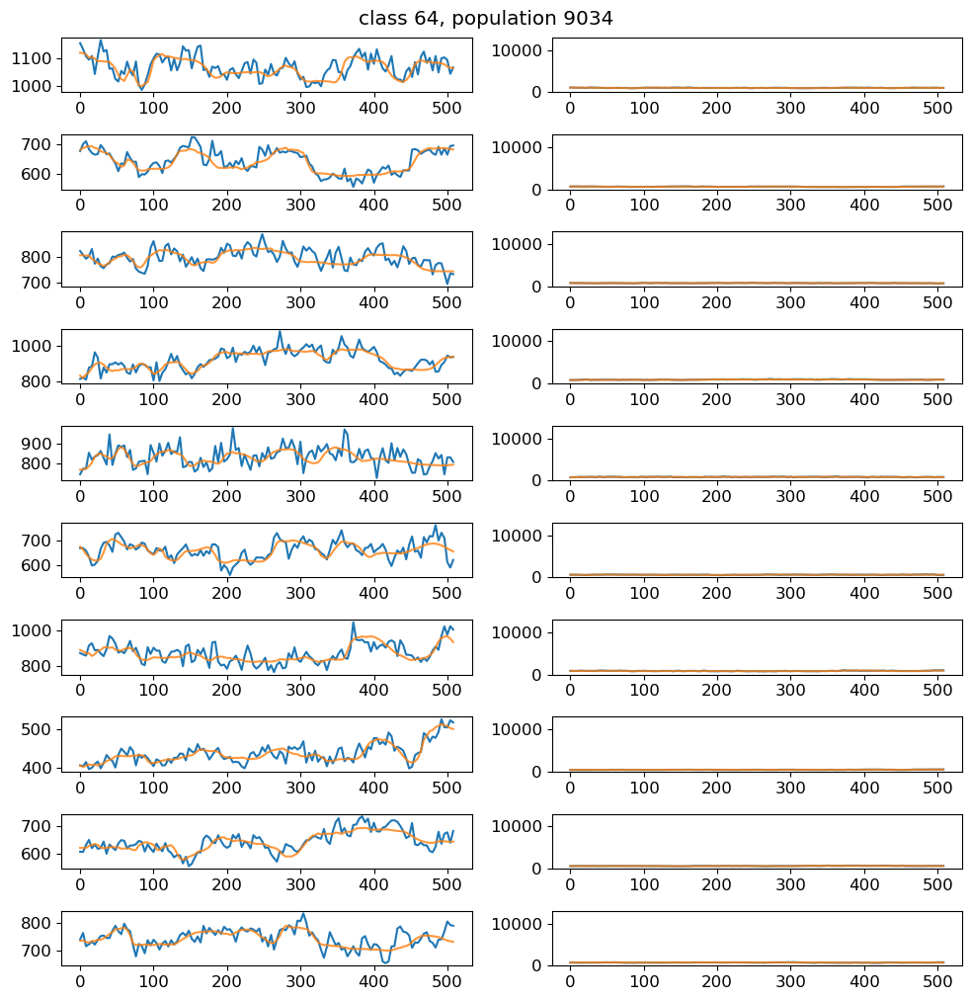

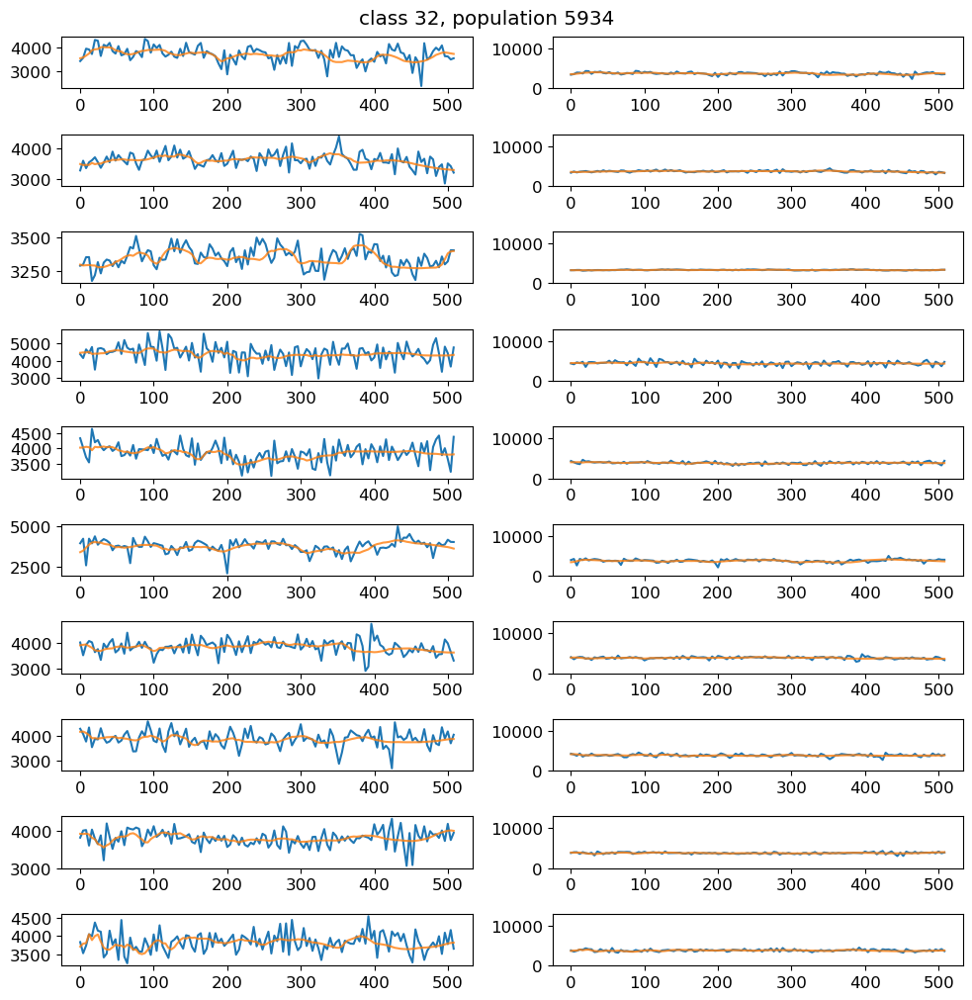

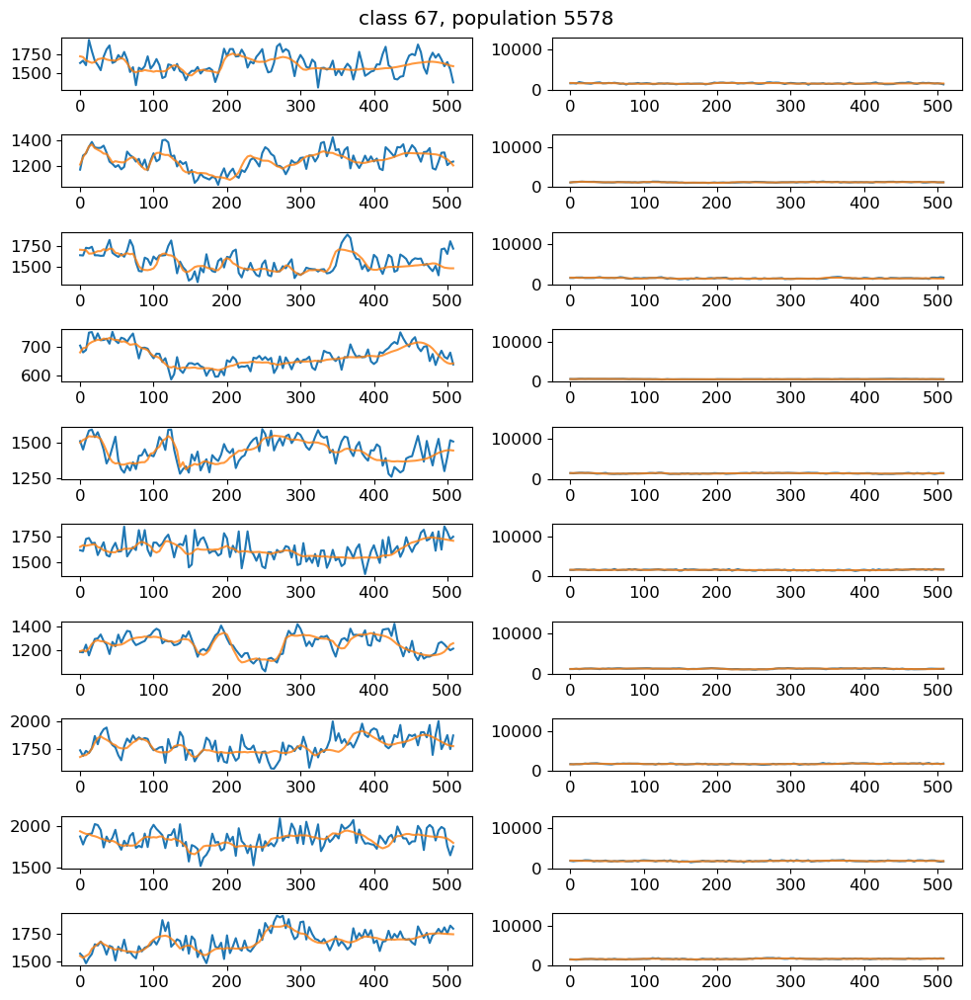

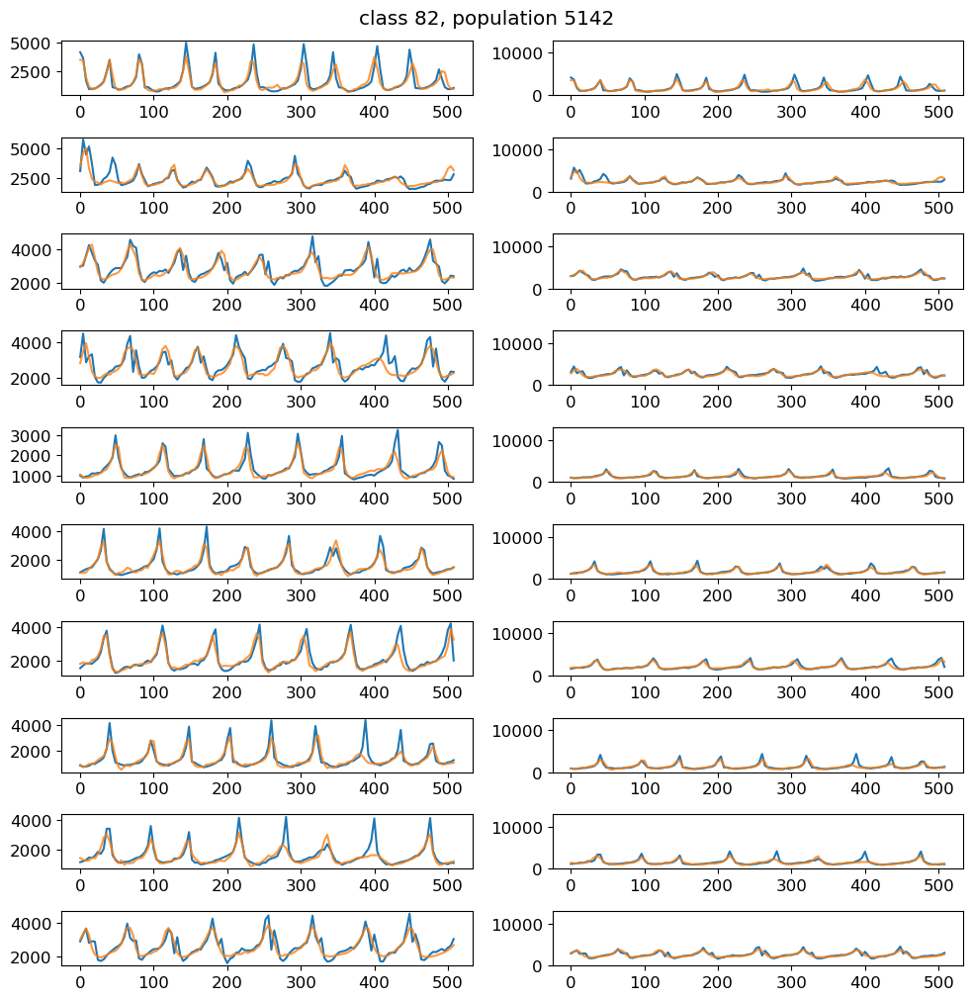

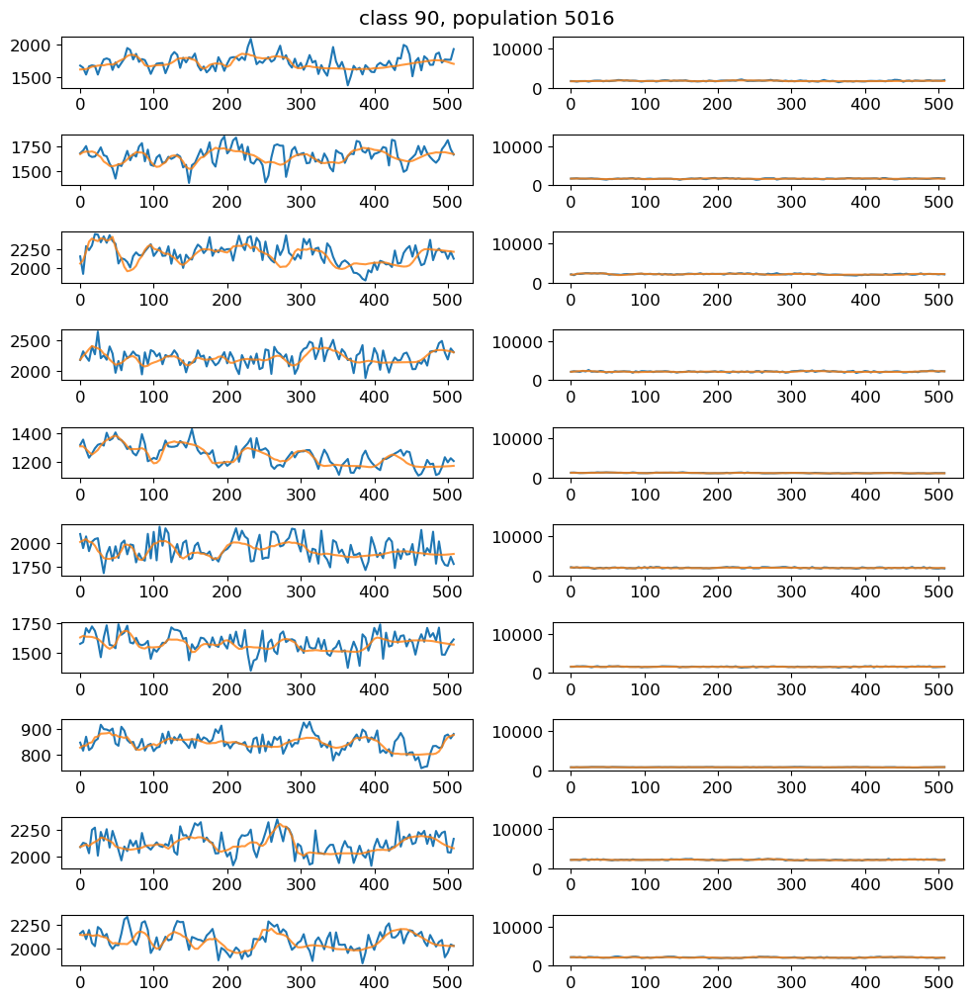

...

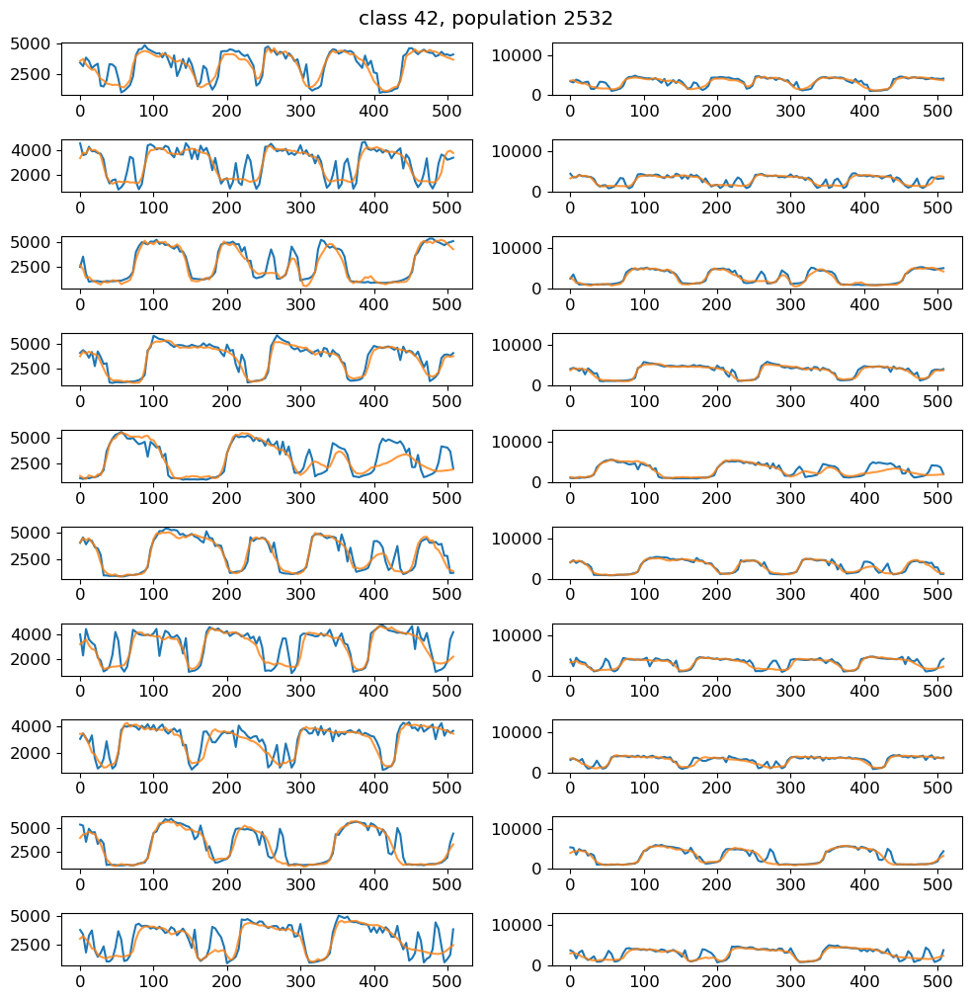

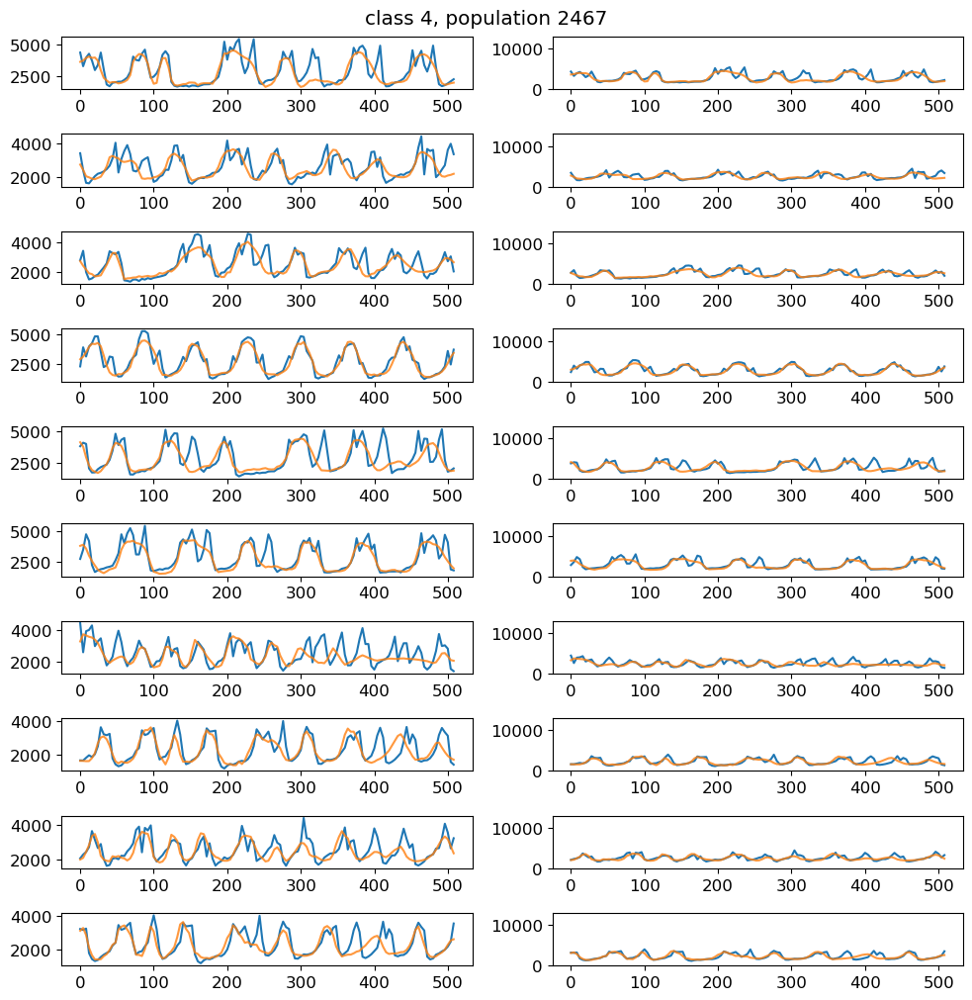

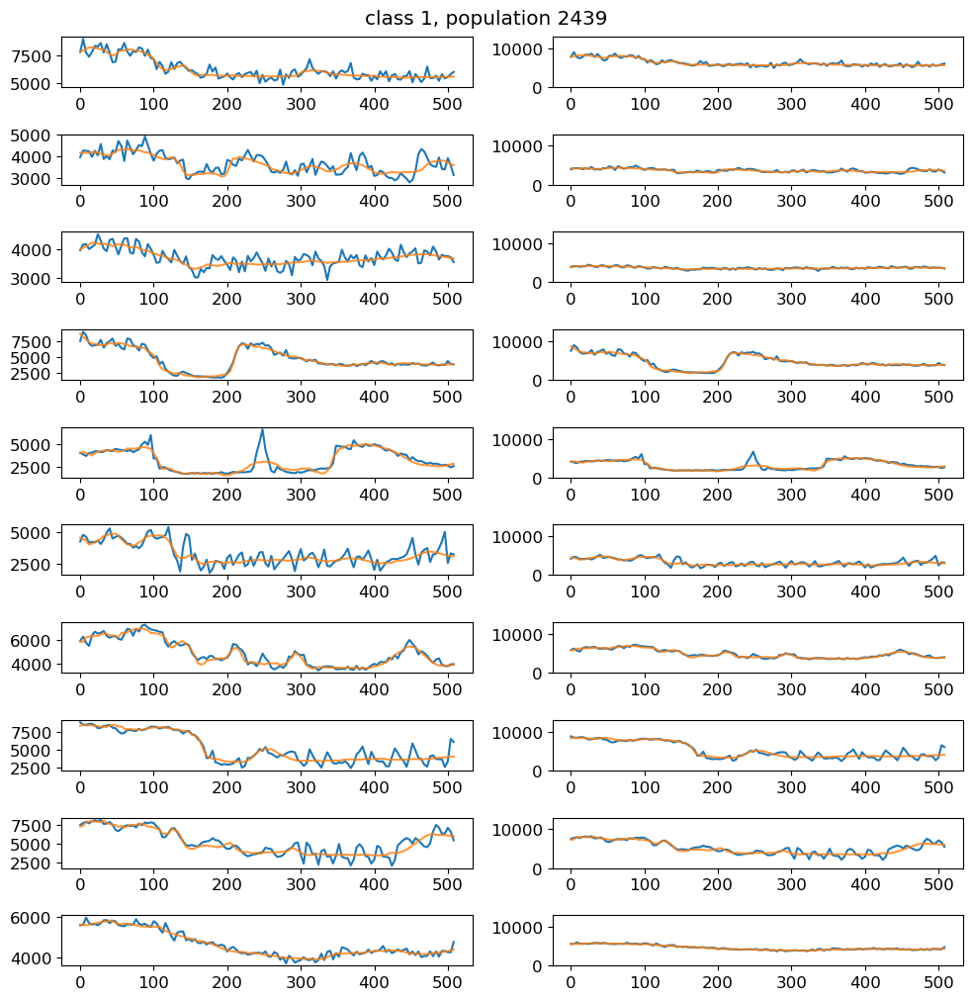

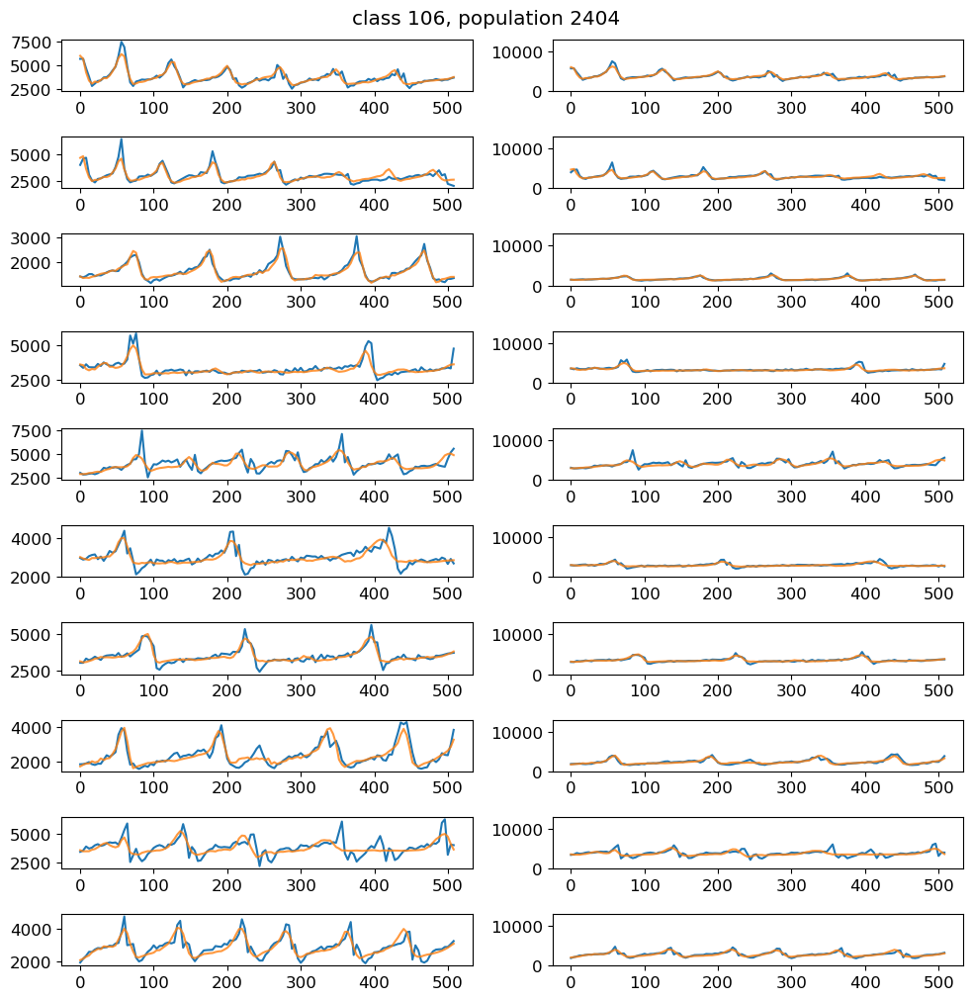

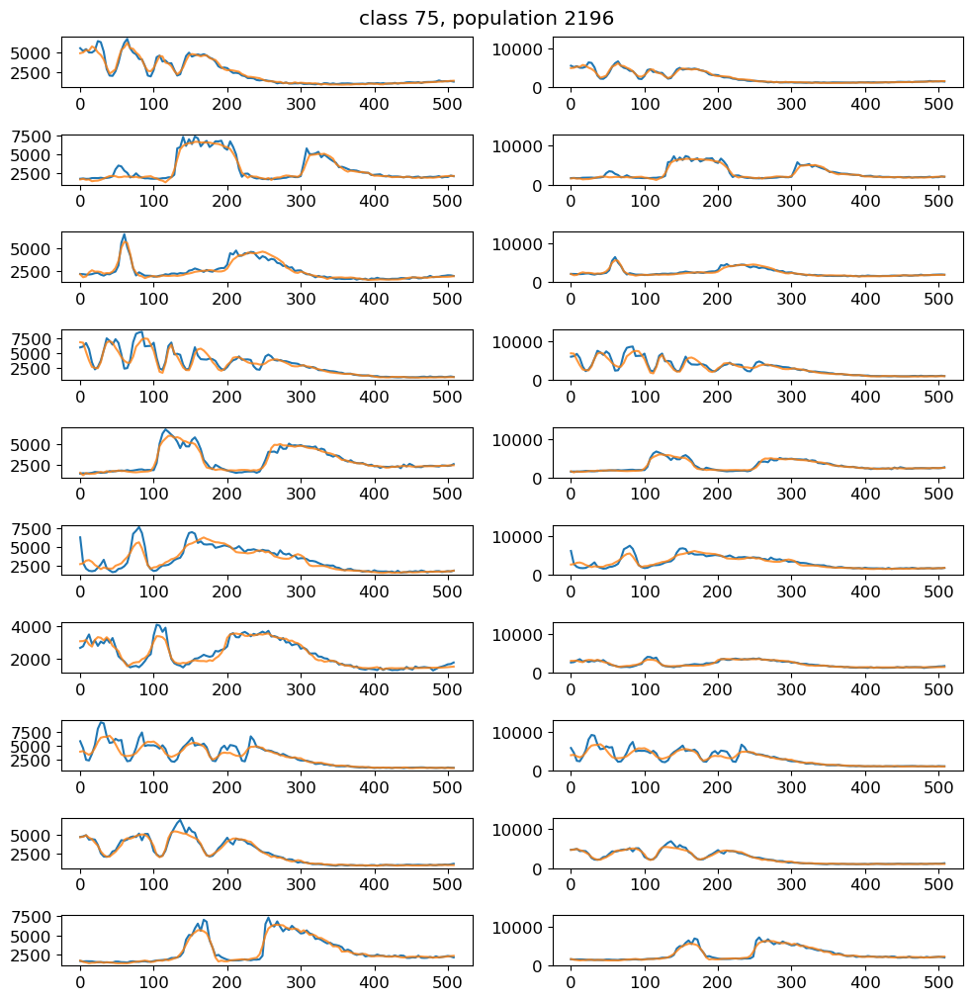

In [304]:
plt.close()

plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams.update({'font.size': 12})

counts = np.unique(shape_moments_GM114_labels, return_counts=1)
only = [32, 1, 64, 67, 100, 4, 104, 106, 75, 42, 113, 82, 84, 89, 90]

labels = shape_moments_GM114_labels
# counts = [29,21]

how_many_to_plot = 10
for ind, new_class in enumerate(counts[0][np.argsort(counts[1])[::-1]]):
    if new_class not in only:
        continue
    class_segments = np.where(labels == new_class)[0]
    fig, axes = plt.subplots(nrows=how_many_to_plot, ncols=2)
    
    for subplot in range(how_many_to_plot):
        data = segments_counts[class_segments[subplot]]
        reconstruction = segment_reconstructions[class_segments[subplot]]
        axes[subplot, 0].plot(np.array(list(range(128)))*4,segments_counts[class_segments[subplot]])#, c="green", linewidth=0.5, zorder=-5)
        axes[subplot, 0].plot(np.array(list(range(128)))*4, reconstruction*np.std(data)+np.mean(data), alpha=0.8)
        axes[subplot, 1].plot(np.array(list(range(128)))*4,segments_counts[class_segments[subplot]])
        axes[subplot, 1].plot(np.array(list(range(128)))*4, reconstruction*np.std(data)+np.mean(data), alpha=0.8)
        axes[subplot, 1].set_ylim([0, 13000])
    plt.suptitle("class {}, population {}".format(new_class, np.sort(counts[1])[::-1][ind]), y=1.01)
    plt.tight_layout()
    plt.show()



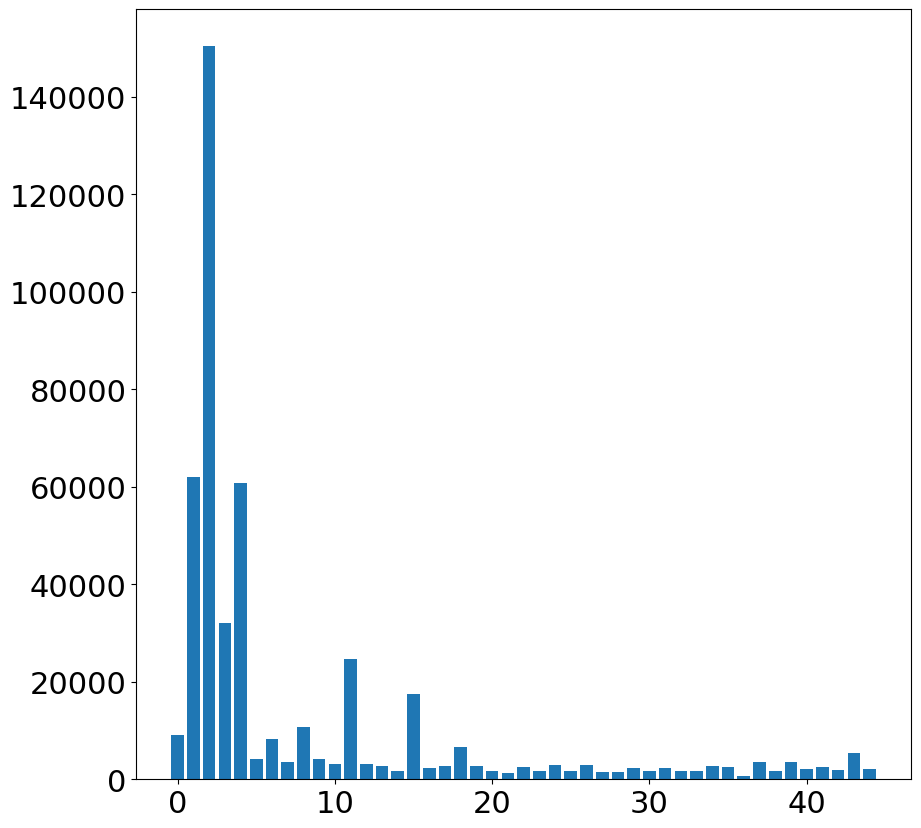

In [255]:
plt.rcParams.update({'font.size': 22})

# plt.bar(list(range(len(np.unique(shape_moments_GM114_labels, return_counts=1)[1]))), height=np.unique(shape_moments_GM114_labels, return_counts=1)[1])
plt.bar(list(range(len(np.unique(new_labels, return_counts=1)[1]))), height=np.unique(new_labels, return_counts=1)[1])

plt.show()

In [108]:
colours = ['#ffd8b1', '#000075', '#808080', '#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff', '#9a6324', '#fffac8', '#800000', '#aaffc3', '#808000', '#000000']


In [257]:
with open('{}/UMAP_transformed_20d_shape16_moments4_trainedonall_468202.pkl'.format(data_dir), 'rb') as f:
    umaped_data = pickle.load(f)

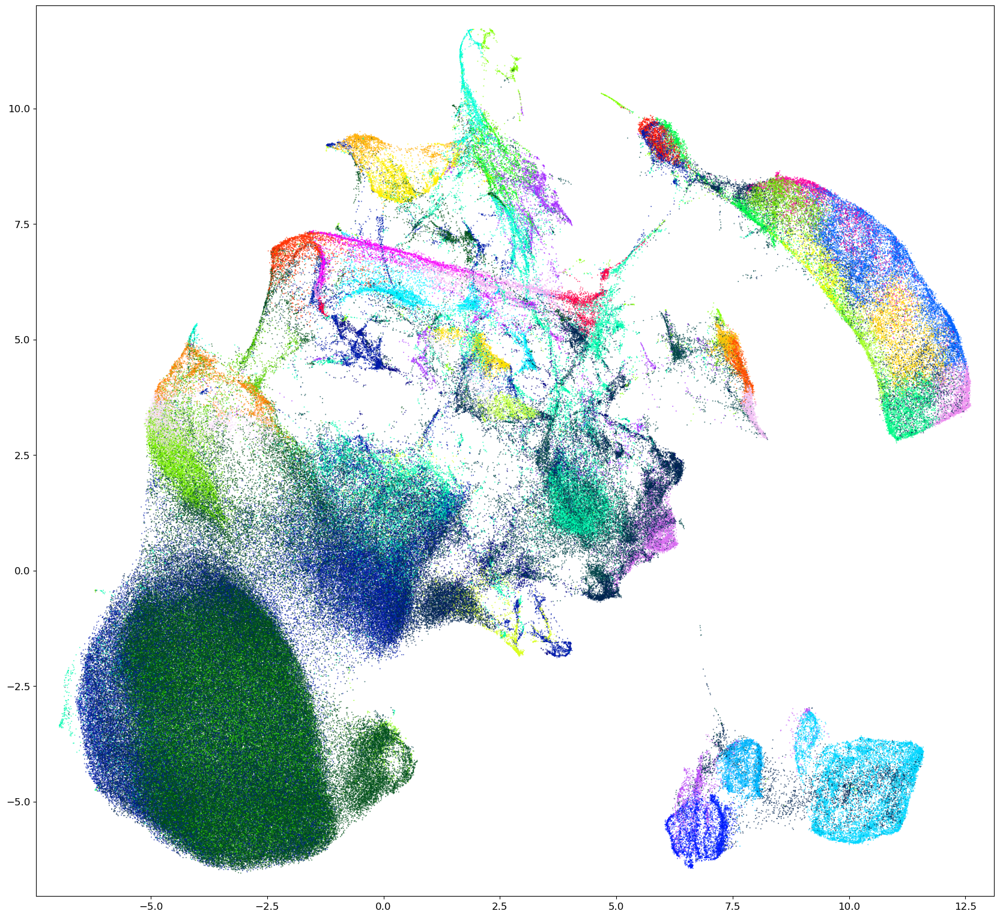

In [259]:
plt.rcParams.update({'font.size': 12})
plt.rcParams['figure.figsize'] = (20, 20)

plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(umaped_data[:,0], umaped_data[:,1], s=0.1, c=new_labels, cmap="gist_ncar")
# for nb, brejk in enumerate(breaks[:-1]):
#     plt.scatter(umaped_data[clust.ordering_][labels == 0][brejk:breaks[nb+1],0], umaped_data[clust.ordering_][labels == 0][brejk:breaks[nb+1],1], s=0.1)
plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])
plt.show()

In [40]:
len(remaining_components)

20

In [232]:
with open('{}/OPTICS_shape16_moments4_max_eps4_min_samp500_euclidean_alldata.pkl'.format(data_dir), 'rb') as f:
    optics_shape_moments = pickle.load(f)

In [135]:
optics_shape_moments.cluster_hierarchy_

array([[     0, 467596]])

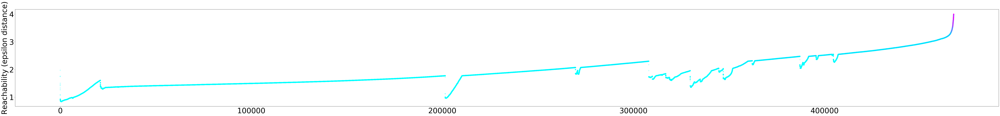

In [250]:
# Reachability plot
clust = optics_shape_moments

plt.rcParams['figure.figsize'] = (100,10)
plt.rcParams.update({'font.size': 42})



# labels_050 = cluster_optics_dbscan(reachability=clust.reachability_,
#                                    core_distances=clust.core_distances_,
#                                    ordering=clust.ordering_, eps=0.5)
# labels_200 = cluster_optics_dbscan(reachability=clust.reachability_,
#                                    core_distances=clust.core_distances_,
#                                    ordering=clust.ordering_, eps=2)

space = np.arange(len(shape_moments))
reachability = clust.reachability_[clust.ordering_]
labels = clust.labels_[clust.ordering_]

# breaks = [0,21430,199990,242305,303065,309196,371590,383575,391430,395315, 414530, 468201]#371590
# for nb, brejk in enumerate(breaks[:-1]):
#     Xk = space[labels == 0][brejk:breaks[nb+1]]
#     Rk = reachability[labels == 0][brejk:breaks[nb+1]]
#     plt.scatter(Xk, Rk, alpha=1)
    

# plt.plot(space[labels == -1], reachability[labels == -1], 'white', alpha=0.3)
plt.scatter(space, reachability, alpha=0.1, c=np.array(shape_moments_GM114_labels_volume_fake)[clust.ordering_], cmap="cool")
# plt.plot(space, np.full_like(space, 0.5, dtype=float), 'k-.', alpha=0.5)
plt.ylabel('Reachability (epsilon distance)')
# plt.set_title('Reachability Plot')
plt.show()

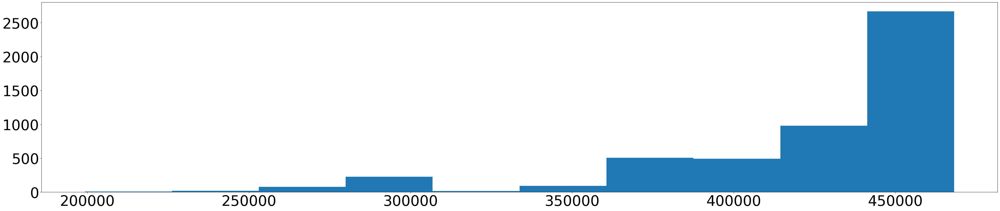

In [251]:
plt.rcParams['figure.figsize'] = (50,10)

plt.hist(np.where(np.array(shape_moments_GM114_labels_volume_fake)[clust.ordering_] == 0.9)[0])
plt.show()

In [147]:
counts = np.unique(new_labels, return_counts=1)
print(counts)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]), array([  9035,  62021, 148973,  32093,  64364,   4191,   8185,   3533,
        10763,   4088,  24735,   3066,   2680,   1740,  17500,   2274,
         2650,   1484,   6547,   2646,   1761,   1233,   2443,   1713,
         2870,   1613,   2998,   1567,   1831,   2374,   1745,   2261,
         1683,   1737,   2637,   2498,    727,   1692,   3642,   2054,
         1250,   1486,   2435,   1909,   5388,   2087]))


In [235]:
shape_moments_GM114_labels_volume_fake[clust.ordering_]

TypeError: only integer scalar arrays can be converted to a scalar index

In [142]:
segments_dir = '{}/468202_len128_s2_4cad_counts_errorfix.pkl'.format(data_dir)
errors_dir = '{}/468202_len128_s2_4cad_errors_errorfix.pkl'.format(data_dir)

with open(segments_dir, 'rb') as f:
    segments = pickle.load(f)
with open(errors_dir, 'rb') as f:
    errors = pickle.load(f)
    
with open("{}/reconstructions_from_model_2020-04-29_09-12-23.pkl".format(data_dir), 'rb') as f:
    segment_reconstructions = pickle.load(f)


# errors = ((errors)/np.expand_dims(np.std(segments, axis=1), axis=1)).astype(np.float32)
# segments = zscore(segments, axis=1).astype(np.float32)  # standardize per segment

In [ ]:
from sklearn.mixture import BayesianGaussianMixture
bgm = BayesianGaussianMixture(weight_concentration_prior_type="dirichlet_process",n_components=150,verbose=1,random_state=11)
bgm.fit(shape_moments)

Initialization 0


In [ ]:
with open('{}/BayesianGaussianMixture_shape_moments_dirchlet_process_150comp_rng11.pkl'.format(data_dir), 'wb') as f:
    pickle.dump(bgm, f)

In [6]:
shape_moments_bgm_labels = bgm.predict(shape_moments)

In [7]:
np.unique(shape_moments_bgm_labels, return_counts=1)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
        117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
        130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
        143, 144, 145, 146, 147, 148, 149]),
 array([ 2263,  2243,  1270,  4231,  1985,  2117,  2360,  1205,  1654,
         1986,  1406,   957,   633,  2515,  2294,  1773,  2669,  1259,
         2

In [14]:
# plt.rcParams['figure.figsize'] = (10,10)
# plt.rcParams.update({'font.size': 12})



# for ind, new_class in enumerate(counts[0][np.argsort(counts[1])[::-1]]):
#     class_segments = np.where(new_labels == new_class)[0]
#     fig, axes = plt.subplots(nrows=5, ncols=2)
    
#     for subplot in range(5):
#         axes[subplot, 0].plot(np.array(list(range(128)))*4,segments[class_segments[subplot]])#, c="green", linewidth=0.5, zorder=-5)
#         axes[subplot, 1].plot(np.array(list(range(128)))*4,segments[class_segments[subplot]])
#         axes[subplot, 1].set_ylim([0, 13000])
#     plt.suptitle("class {}, population {}".format(new_class, np.sort(counts[1])[::-1][ind]), y=1.01)
#     plt.tight_layout()
#     plt.show()
#     break


In [23]:
np.unique(shape_moments_GM114_labels, return_counts=1)

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105, 106, 107, 108, 109, 110, 111, 112, 113]),
 array([ 3095,  2439,  1740,  5177,  2467,  8659,  5940, 17500,  2274,
         2913,  7617,  3532,  2650,  1484,  6103,  7195,  6547,  3846,
         2404,  2955,  1837,  2646,  3613,  1761,  7399,  1893,  1233,
         8329, 13291,  2443,  1713,  2870,  5934,  5216,  1613,  2055,
         7917,  8895,  2998,  1524,  1595,  2183,  2532,  1567,  6340,
 

In [328]:
with open("{}/reconstructions_from_model_2020-04-29_09-12-23.pkl".format(data_dir), 'rb') as f:
    segment_reconstructions = pickle.load(f)

In [126]:
plt.close()

plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams.update({'font.size': 12})

counts = np.unique(shape_moments_GM114_labels, return_counts=1)

how_many_to_plot = 10
for ind, new_class in enumerate(counts[0][np.argsort(counts[1])[::-1]]):
    class_segments = np.where(shape_moments_GM114_labels == new_class)[0]
    fig, axes = plt.subplots(nrows=how_many_to_plot, ncols=2)
    
    for subplot in range(how_many_to_plot):
        data = segments_counts[class_segments[subplot]]
        reconstruction = segment_reconstructions[class_segments[subplot]]
        axes[subplot, 0].plot(np.array(list(range(128)))*4,segments_counts[class_segments[subplot]])#, c="green", linewidth=0.5, zorder=-5)
        axes[subplot, 0].plot(np.array(list(range(128)))*4, reconstruction*np.std(data)+np.mean(data))
        axes[subplot, 1].plot(np.array(list(range(128)))*4,segments_counts[class_segments[subplot]])
        axes[subplot, 1].plot(np.array(list(range(128)))*4, reconstruction*np.std(data)+np.mean(data))
        axes[subplot, 1].set_ylim([0, 13000])
    plt.suptitle("class {}, population {}".format(new_class, np.sort(counts[1])[::-1][ind]), y=1.01)
    plt.tight_layout()
    plt.show()


TypeError: only integer scalar arrays can be converted to a scalar index

In [125]:
counts[1][47]

1831

In [121]:
np.std(segments_counts[class_segments[subplot]])

785.8965196097763

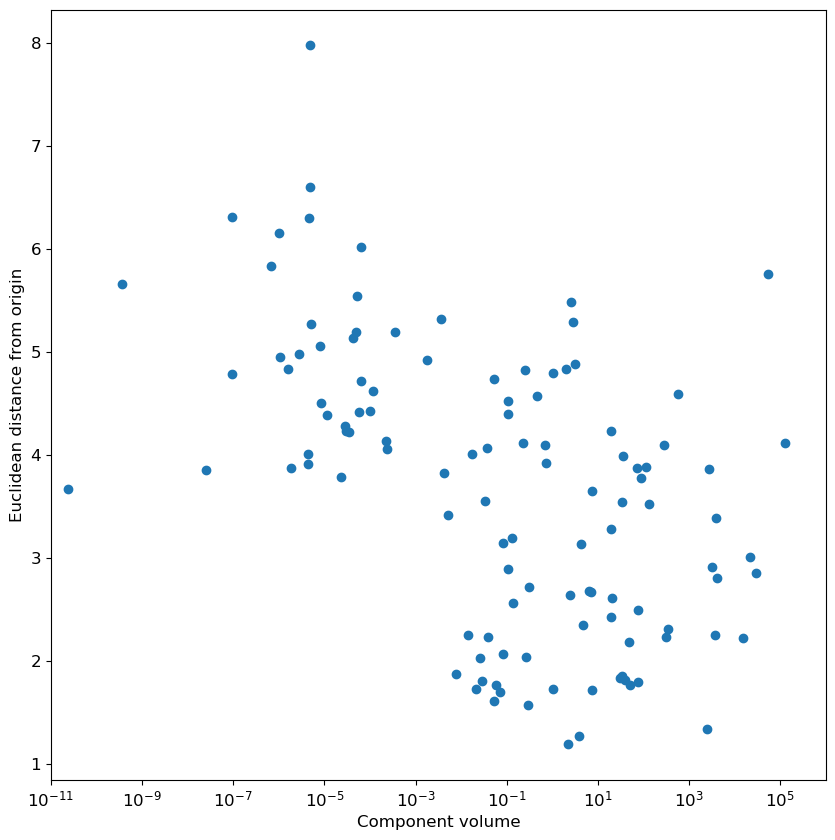

In [44]:
plt.scatter(component_vol_members_density_df.volume.values, component_vol_members_density_df.origin_dist.values)
plt.gca().set_xscale("log")
plt.xlim([1e-11, 1e6])
plt.ylabel("Euclidean distance from origin")
plt.xlabel("Component volume")
plt.show()

In [225]:
umap_mapper_GM114 = umap.UMAP()
umaped_data = umap_mapper_GM114.fit_transform(clf_GM114.means_)

In [57]:
np.min(np.log10(component_vol_members_density_df.volume.values))

-10.621018186359247

In [201]:
fake_colors = np.ones(114)*0.1
fake_colors[21] = 0.9
fake_colors[29] = 0.9

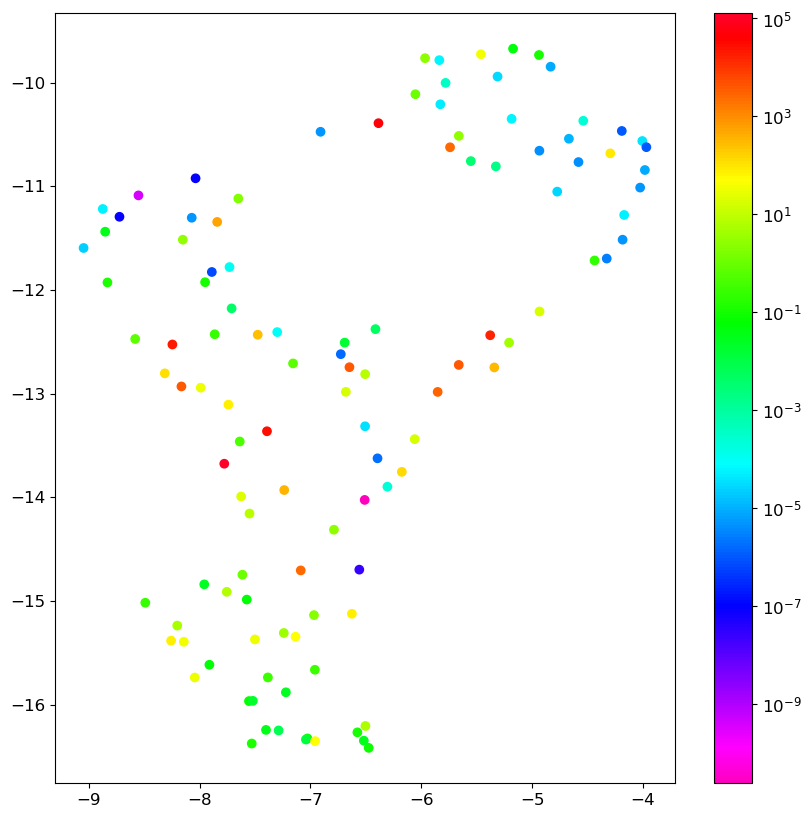

In [227]:
plt.rcParams.update({'font.size': 12})
plt.rcParams['figure.figsize'] = (10,10)
from matplotlib.colors import LogNorm
Z=component_vol_members_density_df.volume.values
plt.scatter(-umaped_data[:,0], -umaped_data[:,1], c=Z, norm=LogNorm(vmin=Z.min(), vmax=Z.max()), cmap="gist_rainbow_r")
# plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
# plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])
plt.colorbar()
plt.show()

In [206]:
with open('{}/UMAP_transformed_20d_shape16_moments4_trainedonall_468202.pkl'.format(data_dir), 'rb') as f:
    umaped_data = pickle.load(f)

In [246]:
shape_moments_GM114_labels_volume = [component_vol_members_density_df.volume.values[x] for x in shape_moments_GM114_labels]
shape_moments_GM114_labels_volume_fake = [0.9 if x in [21, 29] else 0.1 for x in shape_moments_GM114_labels]#21,29

In [272]:
outlier = np.ones(468202)*0.01
outlier[10] = 0.99

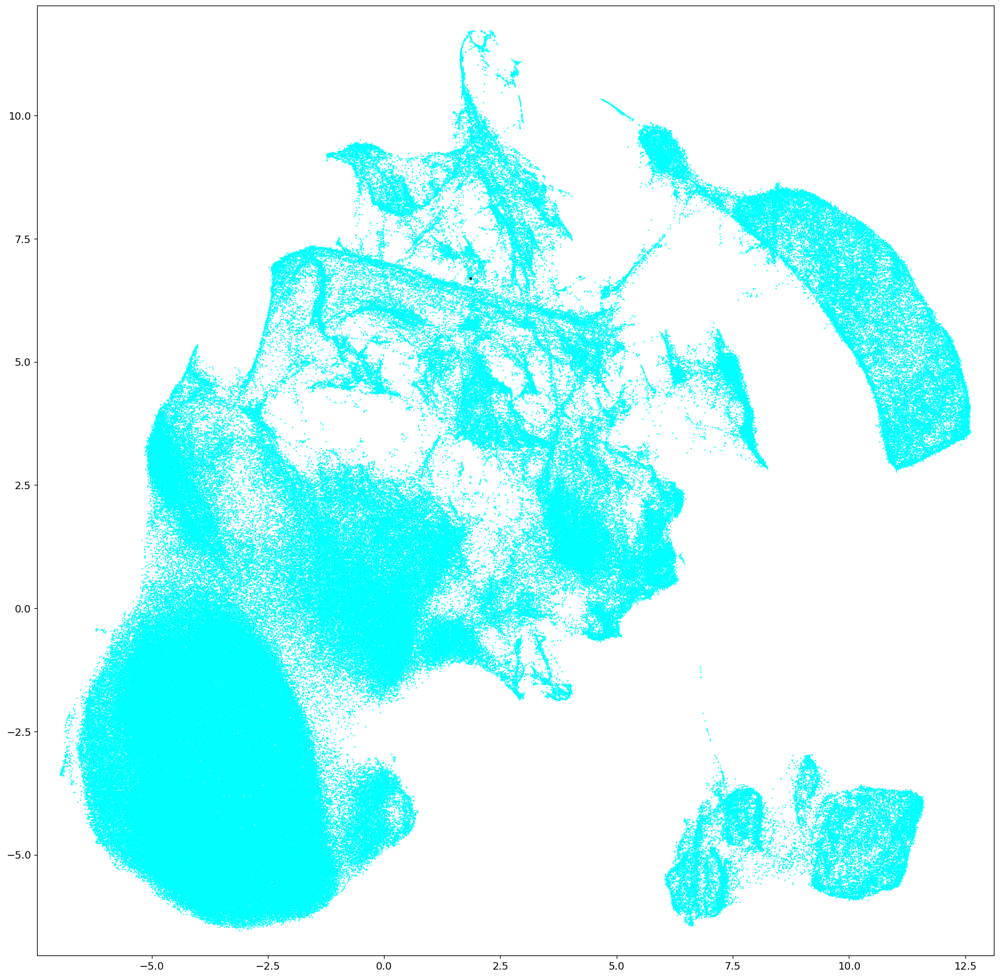

In [278]:
plt.rcParams.update({'font.size': 12})
plt.rcParams['figure.figsize'] = (20,20)

# plt.rcParams['figure.figsize'] = (abs((np.min(umaped_data[:,0])-0.5) -(np.max(umaped_data[:,0])+0.5)), abs((np.min(umaped_data[:,1])-0.5)- (np.max(umaped_data[:,1])+0.5)))
plt.scatter(umaped_data[:,0], umaped_data[:,1], s=0.1, c=outlier, cmap="cool")#, norm=LogNorm(vmin=Z.min(), vmax=Z.max()))
plt.scatter(umaped_data[10][0], umaped_data[10][1], s=5, c="black")#, norm=LogNorm(vmin=Z.min(), vmax=Z.max()))

# for nb, brejk in enumerate(breaks[:-1]):
#     plt.scatter(umaped_data[clust.ordering_][labels == 0][brejk:breaks[nb+1],0], umaped_data[clust.ordering_][labels == 0][brejk:breaks[nb+1],1], s=0.1)
plt.xlim([np.min(umaped_data[:,0])-0.5, np.max(umaped_data[:,0])+0.5])
plt.ylim([np.min(umaped_data[:,1])-0.5, np.max(umaped_data[:,1])+0.5])
# plt.colorbar()

plt.show()

In [277]:
umaped_data[10][1]

6.696494

In [33]:
euclid_func = lambda sample: euclidean(sample, np.zeros(20))
euclid_mapper = map(euclid_func, means) # euclidean distance calculation
euclid_mean_dists=np.array(list(euclid_mapper)) 

In [34]:
euclid_mean_dists

array([3.01599027, 3.65511389, 6.30936261, 2.57025622, 2.42779235,
       1.57740609, 2.8566091 , 1.87555515, 4.42367196, 2.91688644,
       2.23590005, 2.6433791 , 5.20147144, 4.5253846 , 2.68443333,
       3.14807426, 3.78722011, 2.34966562, 6.30240147, 5.19539104,
       4.28801864, 5.75953685, 4.01051818, 5.13798341, 1.19286384,
       3.82347806, 4.8344827 , 1.71691796, 2.07281334, 4.12105271,
       4.50478947, 4.62546282, 2.61625433, 2.67405803, 4.43370136,
       4.10007224, 2.0380011 , 3.55956532, 4.06097135, 5.28935978,
       4.06774626, 4.88258259, 4.23199757, 5.83483857, 1.70202023,
       4.98037077, 2.25638347, 7.98105095, 5.66501018, 5.32653483,
       4.23590154, 3.85987983, 1.27792885, 2.25247442, 6.01865471,
       3.89066686, 5.06449546, 1.76789826, 4.14183727, 4.57208084,
       1.81018374, 4.79764628, 3.67681931, 3.91602503, 1.83810507,
       4.95697535, 4.22284407, 2.19047778, 3.5274427 , 2.8928142 ,
       3.87620064, 4.82639065, 1.34661463, 4.84239982, 5.27464

In [116]:
component_vol_members_density_df.iloc[[47,59]]

,volume,members,density,origin_dist
47,0.000005,1831.0,3.835319e+08,7.981051
59,0.466253,1196.0,2.565131e+03,4.572081


In [253]:
np.unique(new_labels, return_counts=1)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44]),
 array([  9035,  62021, 150457,  32093,  60727,   4191,   8185,   3533,
         10763,   4088,   3081,  24735,   3066,   2680,   1740,  17500,
          2274,   2650,   6547,   2646,   1761,   1233,   2443,   1713,
          2870,   1613,   2998,   1524,   1567,   2374,   1745,   2261,
          1683,   1737,   2637,   2498,    727,   3599,   1692,   3642,
          2054,   2435,   1909,   5388,   2087]))

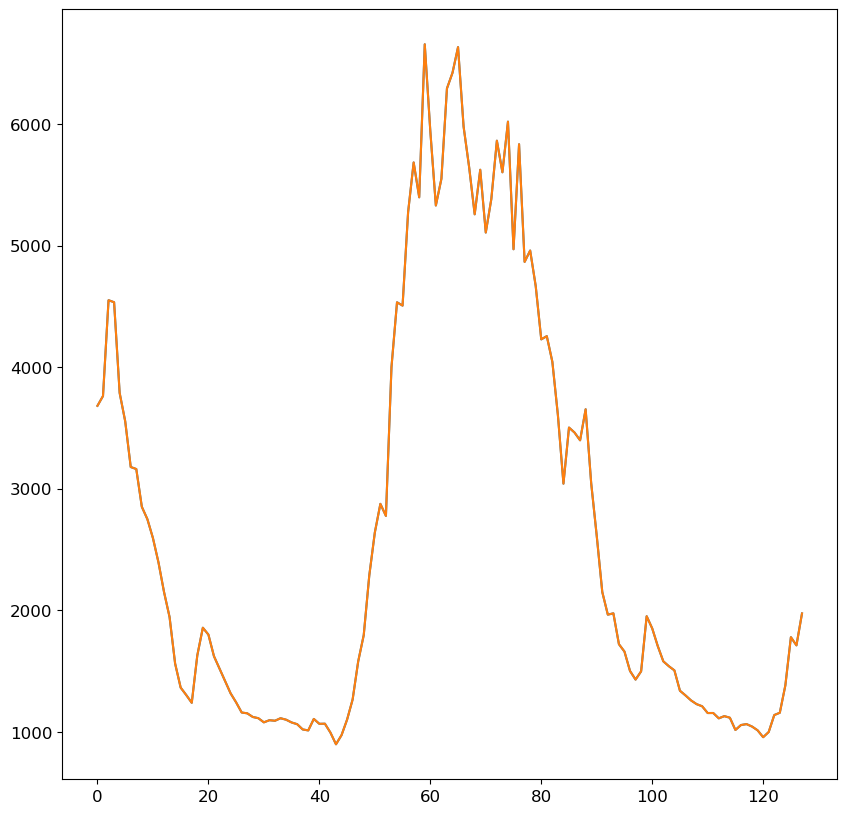

In [271]:
plt.plot(segments_counts[10])
plt.show()

10


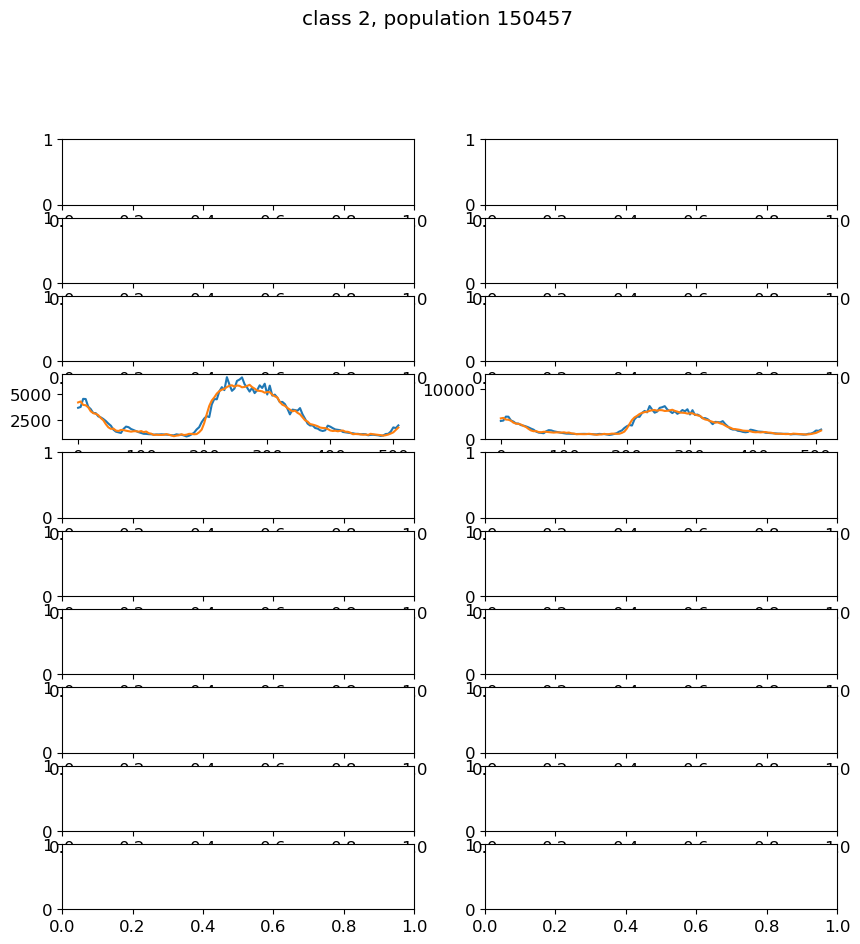

In [269]:
plt.close()
for ind, new_class in enumerate(counts[0][np.argsort(counts[1])[::-1]]):
    class_segments = np.where(labels == new_class)[0]
    fig, axes = plt.subplots(nrows=how_many_to_plot, ncols=2)
    
    subplot = 3
    data = segments_counts[class_segments[subplot]]
    reconstruction = segment_reconstructions[class_segments[subplot]]
    axes[subplot, 0].plot(np.array(list(range(128)))*4,segments_counts[class_segments[subplot]])#, c="green", linewidth=0.5, zorder=-5)
    axes[subplot, 0].plot(np.array(list(range(128)))*4, reconstruction*np.std(data)+np.mean(data))
    axes[subplot, 1].plot(np.array(list(range(128)))*4,segments_counts[class_segments[subplot]])
    axes[subplot, 1].plot(np.array(list(range(128)))*4, reconstruction*np.std(data)+np.mean(data))
    axes[subplot, 1].set_ylim([0, 13000])
    plt.suptitle("class {}, population {}".format(new_class, np.sort(counts[1])[::-1][ind]), y=1.01)
    print(class_segments[subplot])
    break
plt.show()

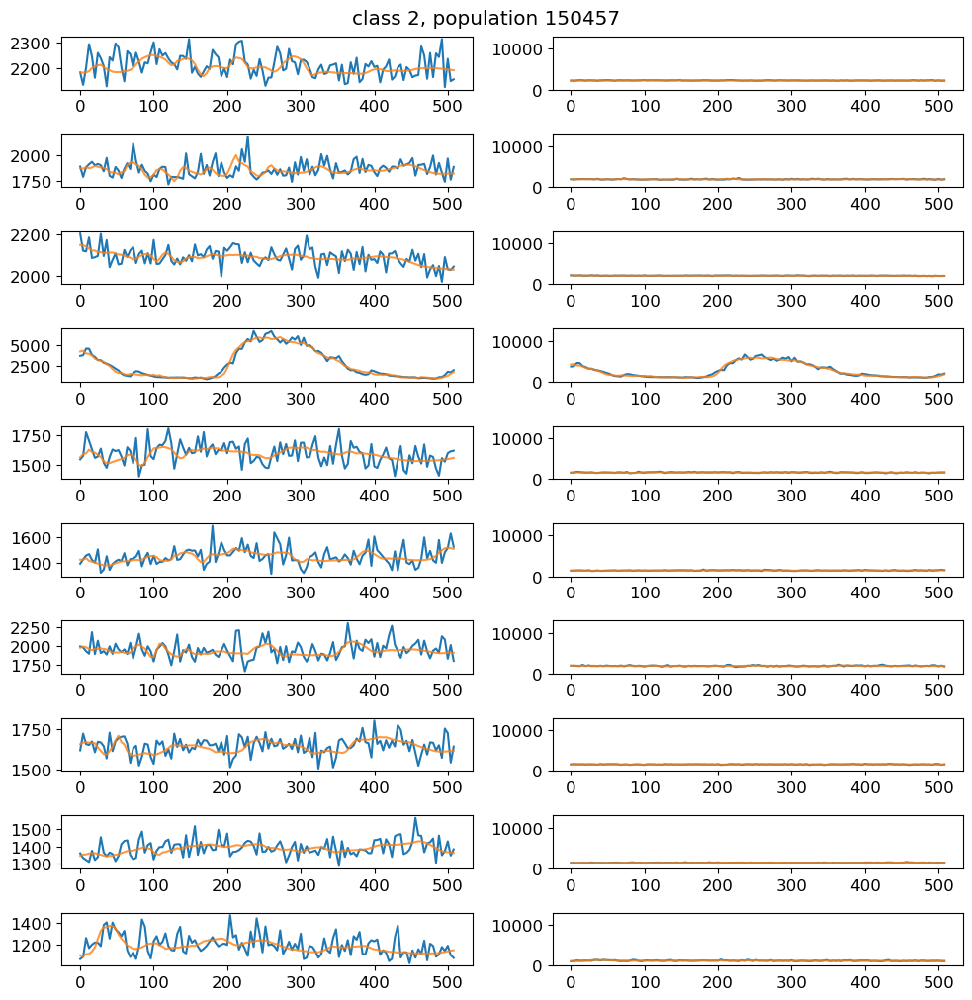

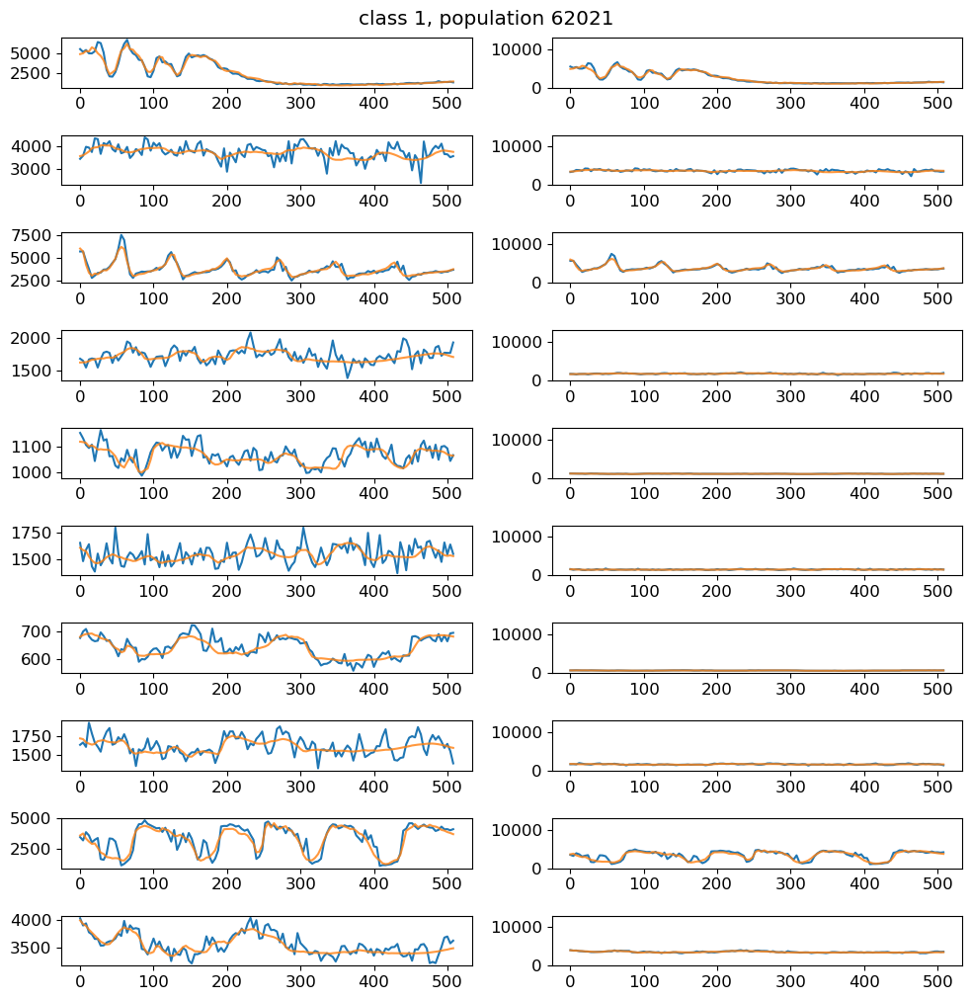

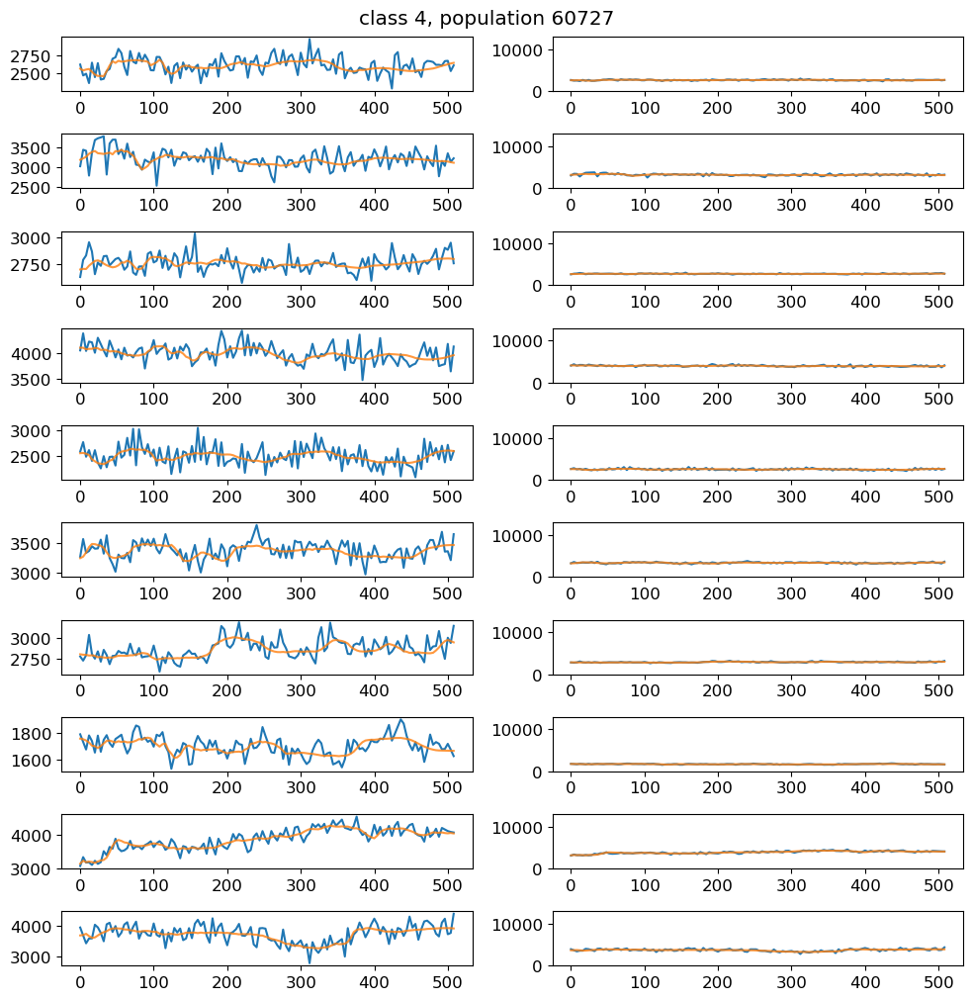

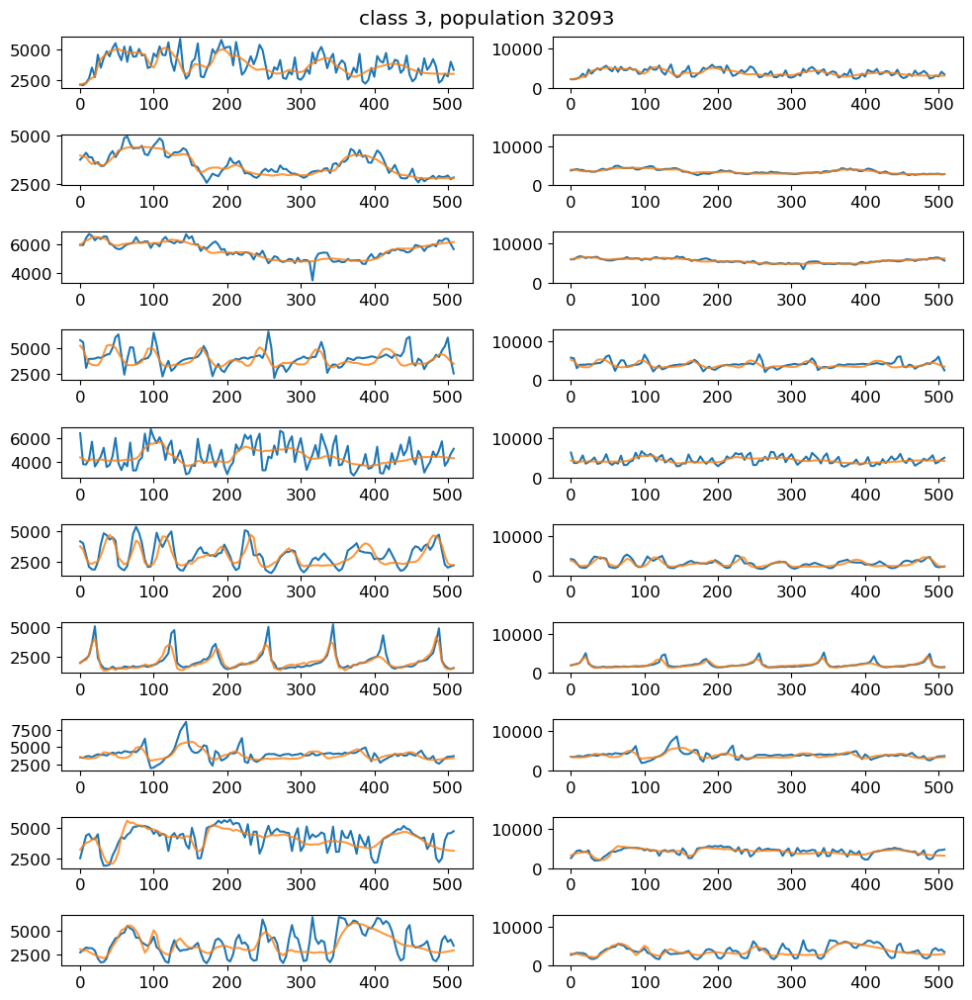

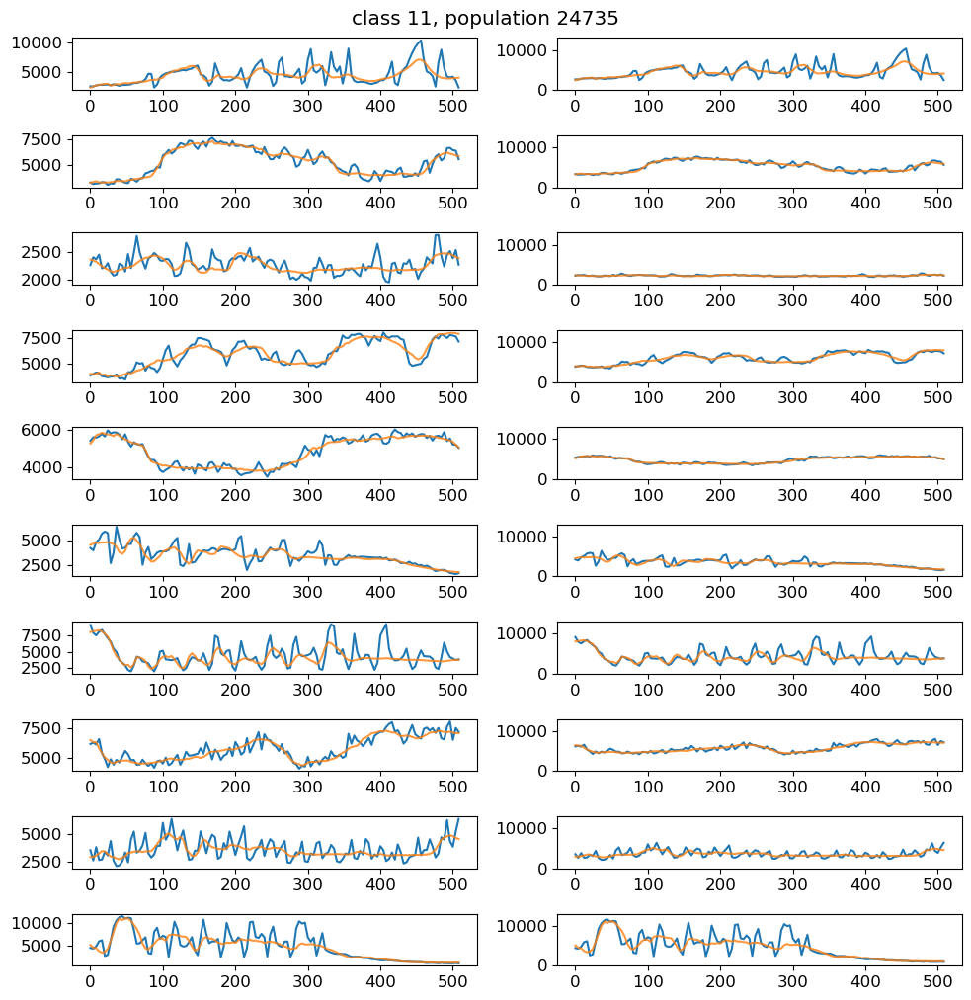

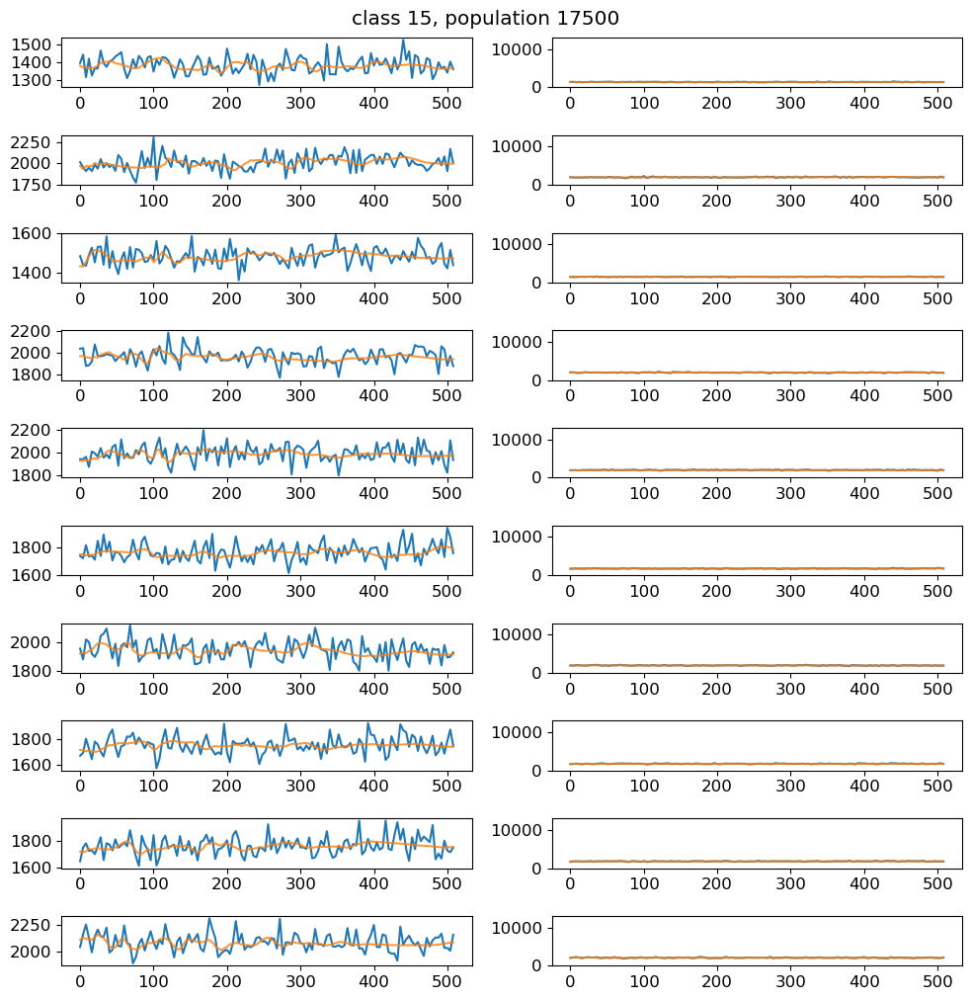

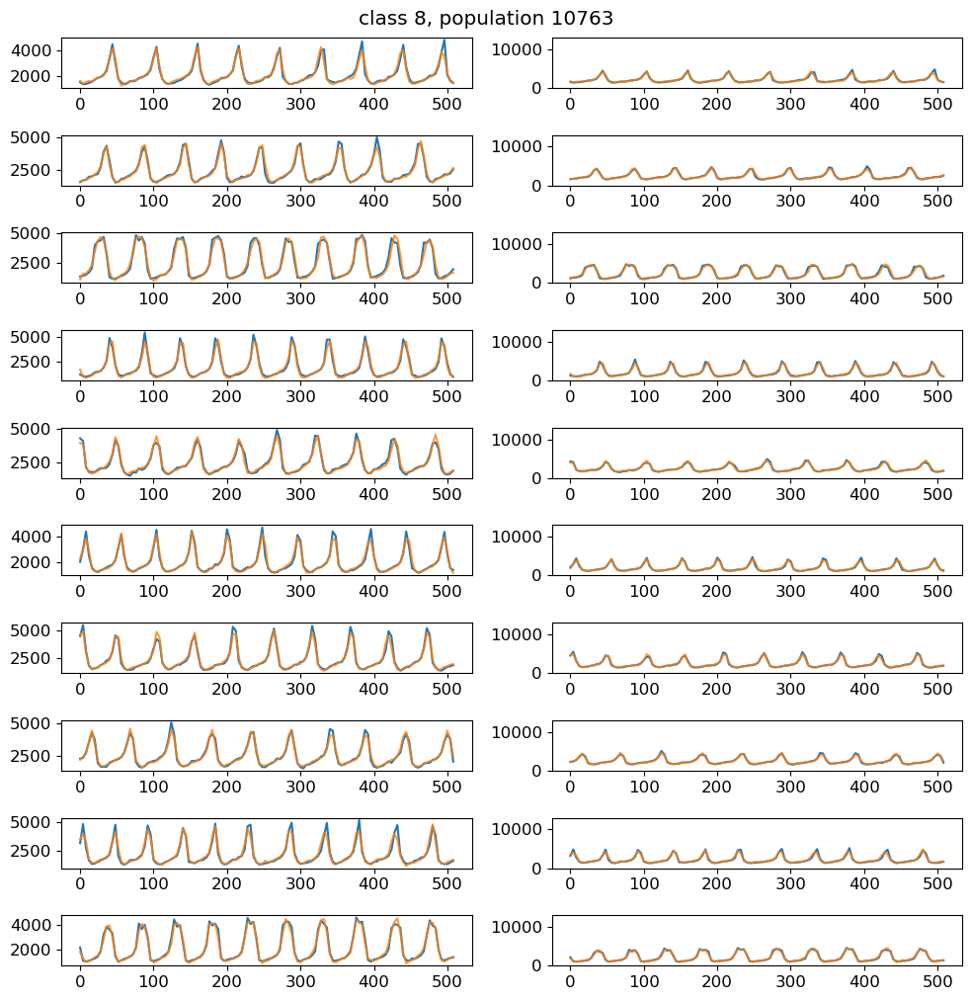

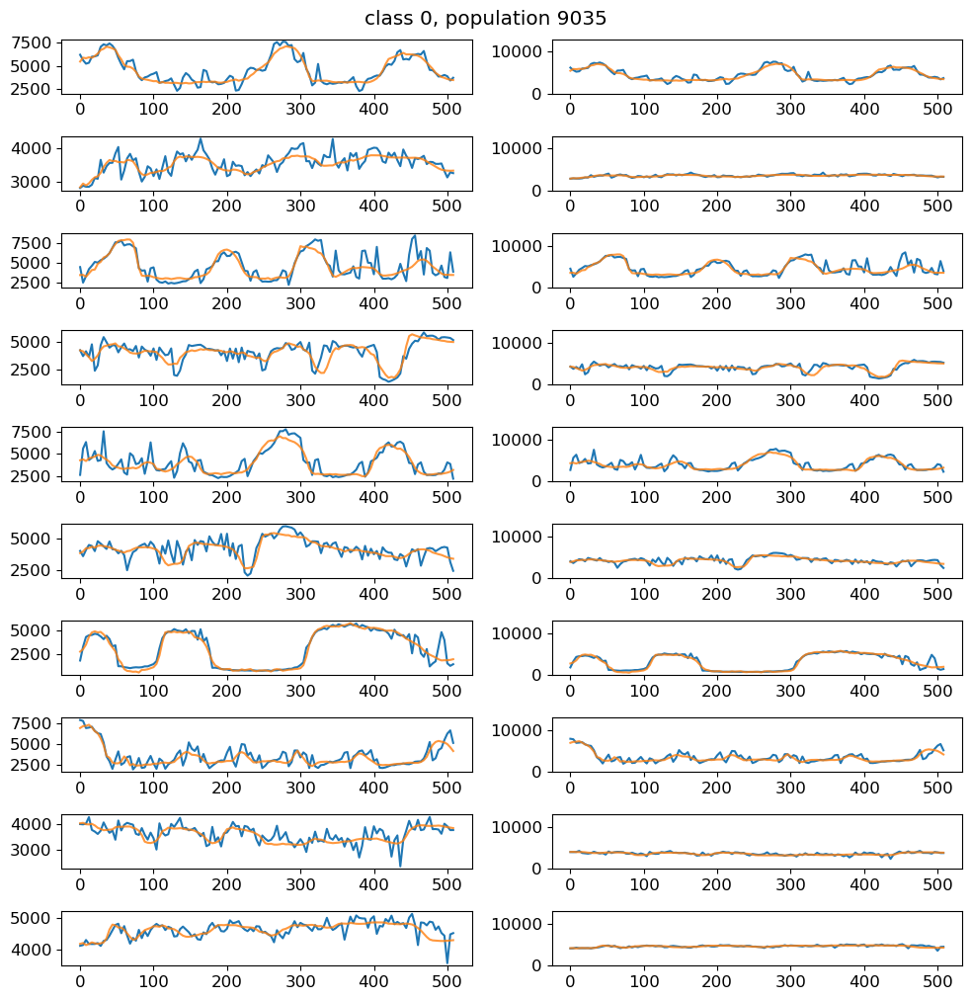

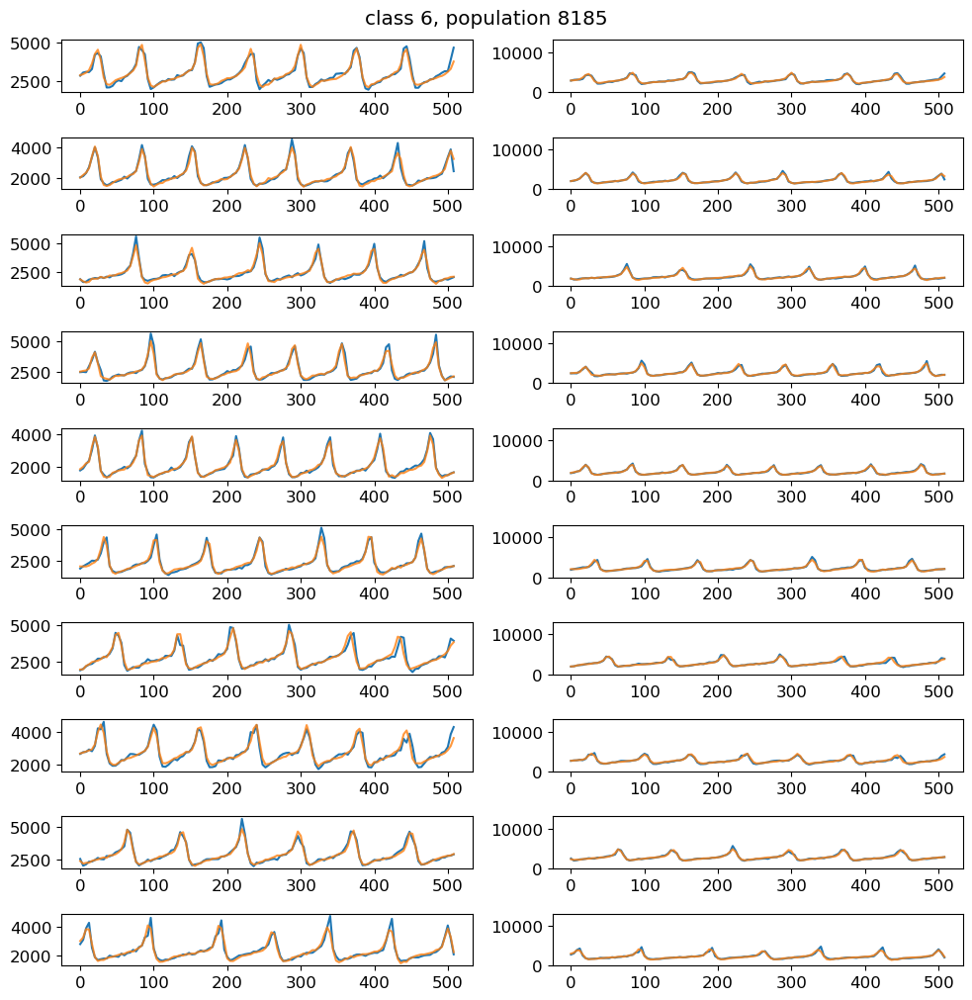

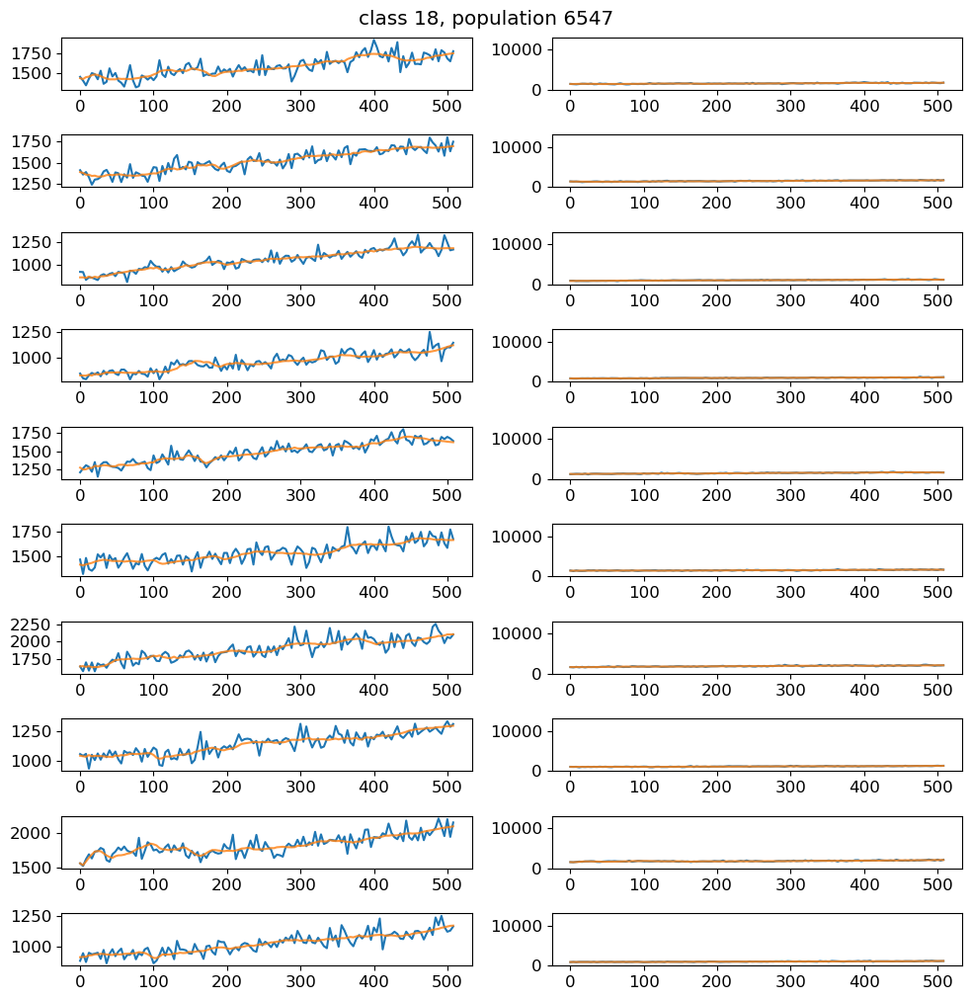

KeyboardInterrupt: 

In [266]:
plt.close()

plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams.update({'font.size': 12})

counts = np.unique(new_labels, return_counts=1)
labels = new_labels
# counts = [29,21]

how_many_to_plot = 10
for ind, new_class in enumerate(counts[0][np.argsort(counts[1])[::-1]]):
    class_segments = np.where(labels == new_class)[0]
    fig, axes = plt.subplots(nrows=how_many_to_plot, ncols=2)
    
    for subplot in range(how_many_to_plot):
        data = segments_counts[class_segments[subplot]]
        reconstruction = segment_reconstructions[class_segments[subplot]]
        axes[subplot, 0].plot(np.array(list(range(128)))*4,segments_counts[class_segments[subplot]])#, c="green", linewidth=0.5, zorder=-5)
        axes[subplot, 0].plot(np.array(list(range(128)))*4, reconstruction*np.std(data)+np.mean(data), alpha=0.8)
        axes[subplot, 1].plot(np.array(list(range(128)))*4,segments_counts[class_segments[subplot]])
        axes[subplot, 1].plot(np.array(list(range(128)))*4, reconstruction*np.std(data)+np.mean(data), alpha=0.8)
        axes[subplot, 1].set_ylim([0, 13000])
    plt.suptitle("class {}, population {}".format(new_class, np.sort(counts[1])[::-1][ind]), y=1.01)
    plt.tight_layout()
    plt.show()


In [117]:
euclidean(np.mean(shape_moments, axis=0), np.zeros(20))

1.7318682848671623e-10

In [79]:
shape_moments_parameter_lims = (np.min(shape_moments, axis=0),np.max(shape_moments, axis=0))

In [97]:
shape_moments_pca = PCA()
shape_moments_pca.fit(shape_moments)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [194]:
n=20
(np.pi**(n/2)/gamma(n/2+1))*np.product(np.sqrt(shape_moments_pca.explained_variance_)*4)

43483574.02160005

In [147]:
for comp in range(114):
    print(np.min(np.sqrt(eig_vals[comp])*3), np.max(np.sqrt(eig_vals[comp])*3))

0.4598998843875074 5.7414214634290275
0.2864470289414292 4.88685250078706
0.07293223666766606 4.500845939547034
0.07896350901301624 4.872778294736107
0.19335739676700364 7.314485207469897
0.0657961847872805 5.385664744463551
0.5102882854053399 6.158324715872349
0.04684054347738972 4.9887091300512
0.177617033794892 4.887763873924781
0.5591007125787154 7.20198955099548
0.021181500496259064 5.634844942048671
0.31333891817085746 4.406711272435768
0.14163524938511632 4.769432650324192
0.25987399704256403 4.922523368119757
0.0763627573976719 5.377825936493965
0.0779634651999184 4.602572631756007
0.05635053539651697 3.994643662191323
0.05681597067449218 5.610282018180668
0.13577521580963792 4.171607972658366
0.13280589944456797 3.6837513237958293
0.10936008387786596 4.031484538145057
0.4059028954744778 12.427955244612239
0.08982689719135159 4.384174341371007
0.14772135238716164 3.742380413517742
0.046714202457866186 5.909017519683814
0.15542384311918617 7.230119530788822
0.11791916761335083 5

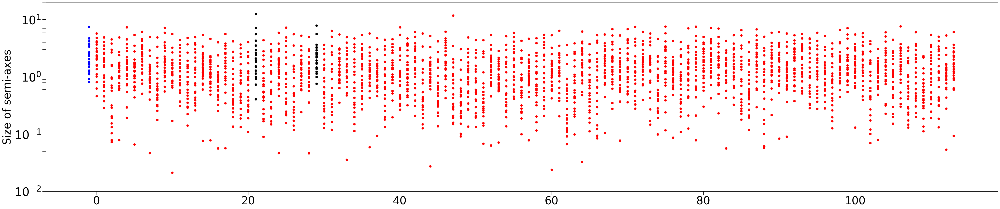

In [312]:
plt.rcParams['figure.figsize'] = (50,10)
plt.rcParams.update({'font.size': 32})

fig, ax1 = plt.subplots()
ax1.tick_params(axis='both', which="both", length=10)

plt.scatter([-1]*20, np.sqrt(shape_moments_pca.explained_variance_)*3, c="blue")
# plt.gca().set_yscale("log")
plt.yticks(fontsize=34)

for comp in range(114):
    c="red"
    if (comp == 29) or (comp == 21):
        c="black"
    plt.scatter([comp]*20, np.sqrt(eig_vals[comp])*3, c=c)
plt.gca().set_yscale("log")
# plt.xticks(fontsize=34)
plt.ylabel("Size of semi-axes")
plt.ylim([0.01, 20])

plt.show()

In [313]:
137895 /6e-4 #229,825,000

229825000.00000003

In [151]:
component_vol_members_density_df.sort_values(by="volume")

,volume,members,density,origin_dist
62,2.393216e-11,2498.0,1.043784e+14,3.676819
48,3.632324e-10,2374.0,6.535761e+12,5.665010
51,2.558777e-08,2261.0,8.836254e+10,3.859880
109,9.299987e-08,5388.0,5.793557e+10,4.789439
2,9.306979e-08,1740.0,1.869565e+10,6.309363
...,...,...,...,...
81,1.533606e+04,8085.0,5.271889e-01,2.225423
0,2.133877e+04,3095.0,1.450412e-01,3.015990
6,2.861963e+04,5940.0,2.075498e-01,2.856609
21,5.295237e+04,2646.0,4.996944e-02,5.759537


In [174]:
np.max(shape_moments_pca.transform(shape_moments), axis=0)/ellips_semiaxes

array([1.06977139, 2.96648786, 1.82923431, 2.53142323, 1.61451239,
       1.67834563, 7.99812476, 4.09795441, 1.6236197 , 7.45218967,
       3.44012696, 2.46933641, 1.844354  , 7.02130383, 8.42827592,
       1.73036564, 9.22694284, 4.99674363, 4.72492853, 4.58465329])

In [176]:
# count all samples outside of the 3 sigma ellipsoid
outside_count3 = 0
outside_count4 = 0
outside_count5 = 0
outside_count6 = 0
outside_count7 = 0

ellips_semiaxes = np.sqrt(shape_moments_pca.explained_variance_)
for n_sample, sample in enumerate(shape_moments_pca.transform(shape_moments)):
    if any((ellips_semiaxes*3 - sample)<0)or any((-ellips_semiaxes*3 - sample)>0):
        outside_count3+=1
    if any((ellips_semiaxes*4 - sample)<0)or any((-ellips_semiaxes*4 - sample)>0):
        outside_count4+=1
    if any((ellips_semiaxes*5 - sample)<0)or any((-ellips_semiaxes*5 - sample)>0):
        outside_count5+=1
    if any((ellips_semiaxes*6 - sample)<0)or any((-ellips_semiaxes*6 - sample)>0):
        outside_count6+=1
    if any((ellips_semiaxes*7 - sample)<0)or any((-ellips_semiaxes*7 - sample)>0):
        outside_count7+=1
    print(n_sample)
    clear_output(wait=True)

468201


In [ ]:
# count all samples outside of the 3 sigma ellipsoid
outside_count = 0


ellips_semiaxes = np.sqrt(eig_vals[0])
for n_sample, sample in enumerate(samples_coords[0]):
    if any((ellips_semiaxes*3 - sample)<0)or any((-ellips_semiaxes*3 - sample)>0):
        outside_count+=1

    print(n_sample)
    clear_output(wait=True)

98208


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [286]:
outside_count/100000

0.98479

In [184]:
no_outside = [outside_count3, outside_count4, outside_count5,outside_count6,outside_count7]

percentage_inside = [100-(x/468201*100) for x in no_outside]

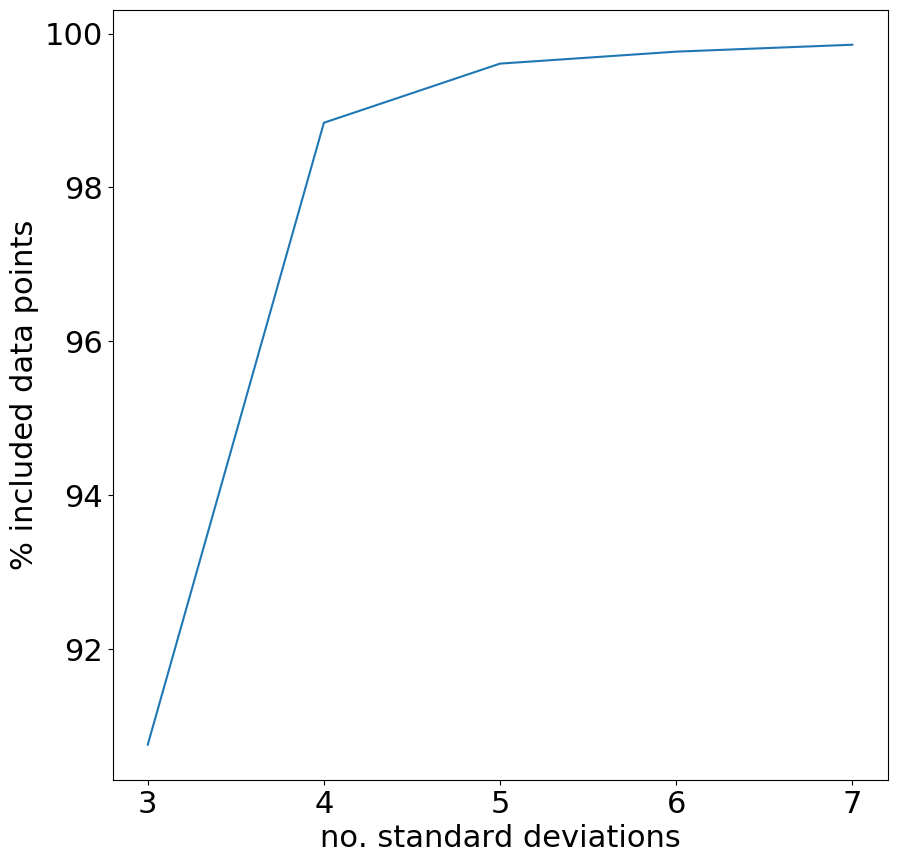

In [190]:
plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams.update({'font.size': 22})

plt.plot([3,4,5,6,7], percentage_inside)
plt.xlabel("no. standard deviations")
plt.ylabel("% included data points")
plt.show()

In [155]:
np.sum(component_vol_members_density_df.sort_values(by="volume").volume.values[:-2])

87849.9446824385

In [113]:
((shape_moments_pca.transform(np.expand_dims(component_means,axis=0)) - (np.mean(shape_moments, axis=0)-np.sqrt(shape_moments_pca.explained_variance_)*3)) < 0)

array([[False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False]])

In [115]:
for n_mean, component_means in enumerate(means):
    if any((shape_moments_pca.transform(np.expand_dims(component_means,axis=0)).flatten() - (np.mean(shape_moments, axis=0)-np.sqrt(shape_moments_pca.explained_variance_)*3)) < 0):
        print(n_mean, "below min")
    if any((shape_moments_pca.transform(np.expand_dims(component_means, axis=0)).flatten() - (np.mean(shape_moments, axis=0)+np.sqrt(shape_moments_pca.explained_variance_)*3)) > 0):
        print(n_mean, "above max")
        print((shape_moments_pca.transform(np.expand_dims(component_means, axis=0)).flatten() - (np.mean(shape_moments, axis=0)+np.sqrt(shape_moments_pca.explained_variance_)*3)))

47 above max
[-2.54563243 -1.40530412 -0.94995736 -1.51648279 -4.01947629 -3.01424487
  0.52062481 -1.54021169 -2.32745436 -1.57880933 -2.07844782 -2.55898746
 -1.18777099 -1.07967236 -1.24670574 -1.0627494  -1.24034821 -1.01257047
 -1.0218838  -0.81616368]
59 above max
[-5.83572671 -6.59013248 -5.49820138 -4.4563972  -4.83425692 -2.72030348
 -1.69468151 -1.44058464 -2.21671172 -0.60084579 -1.53730229 -1.86083246
 -2.02348209 -0.59141898 -0.09712962 -1.51234787  0.10638773 -0.79997086
 -0.53642812 -0.8754489 ]


In [3]:
from sklearn.cluster import AgglomerativeClustering

hclustering = AgglomerativeClustering(n_clusters=200, affinity='euclidean', memory=None,
                        connectivity=None, compute_full_tree='auto', linkage='ward', distance_threshold=None)

In [5]:
hclustering.fit(shape_moments[:10000, :])

AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='ward', memory=None, n_clusters=200)

In [59]:
import scipy.cluster.hierarchy as sch
batch_no = 1
results2 = []
for method in ["ward", "single"]:
    for batch_no in [1,2,3,4,5]:
        linkage = sch.linkage(shape_moments[int((batch_no-1)*10000):int((batch_no)*10000), :], method=method)
        dendrogram = sch.dendrogram(linkage, truncate_mode="lastp", p=200, leaf_font_size = 12)
        c, coph_dists = cophenet(linkage, pdist(shape_moments[int((batch_no-1)*10000):int((batch_no)*10000), :]))
        results2.append((method, batch_no, c))

In [63]:
linkage = sch.linkage(shape_moments[int((batch_no-1)*10000):int((batch_no)*10000), :], method="average")
dendrogram = sch.dendrogram(linkage, truncate_mode="lastp", p=200, leaf_font_size = 12)

In [ ]:
plt.show()

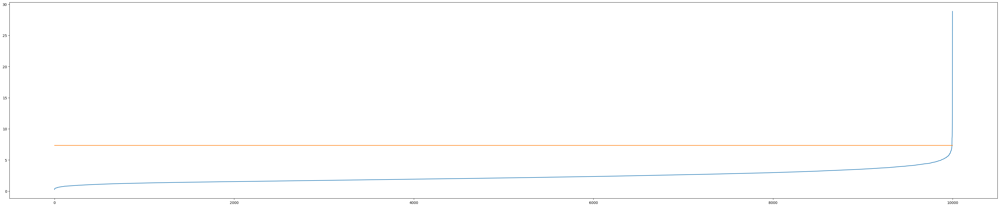

In [84]:
y=7.34
plt.close()
plt.plot(linkage[:,-2])
plt.plot([0,10000],[y,y])
plt.show()

In [90]:
linkage[-19:, 2]

array([ 6.41965396,  6.43628134,  6.49017937,  6.52998751,  6.53420382,
        6.56648554,  6.6255022 ,  6.73199592,  6.78885714,  6.80196957,
        7.01607092,  7.06461337,  7.33713936,  8.49967348,  8.62486918,
        8.9147363 , 10.14677642, 12.4990412 , 28.87279875])

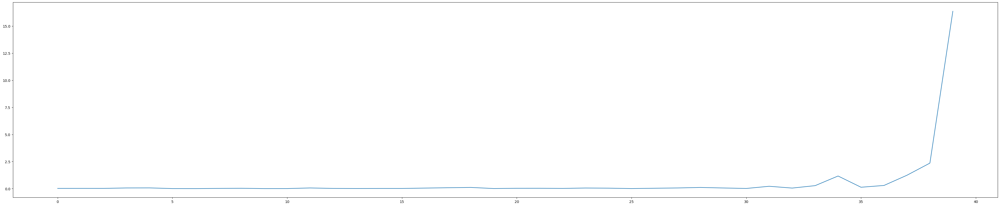

In [87]:
plt.plot(acceleration[-40:])
plt.show()

In [73]:
def fancy_dendrogram(*args, **kwargs):
    """https://joernhees.de/blog/2015/08/26/scipy-hierarchical-clustering-and-dendrogram-tutorial/#Selecting-a-Distance-Cut-Off-aka-Determining-the-Number-of-Clusters"""
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = sch.dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
        plt.ylabel('distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata

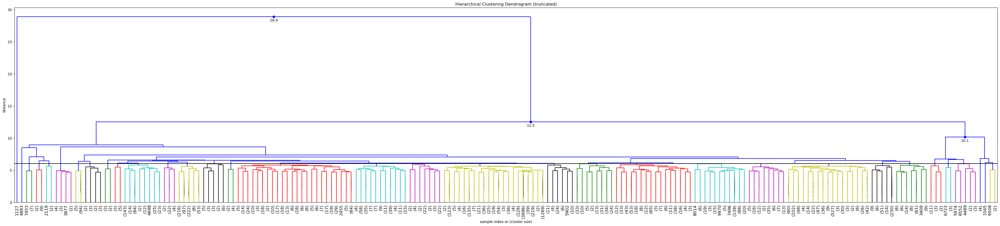

In [74]:
fancy_dendrogram(
    linkage,
    max_d=6,
    truncate_mode='lastp',
    p=200,
#     leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,
    annotate_above=10,  # useful in small plots so annotations don't overlap
)
plt.show()

In [91]:
from scipy.cluster.hierarchy import fcluster
max_d = 6.9
clusters = fcluster(linkage, max_d, criterion='distance')
clusters

array([6, 6, 7, ..., 6, 6, 6], dtype=int32)

In [92]:
np.unique(clusters,return_counts=1 )

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int32),
 array([   8,   14,    1,   10,  109, 7547, 2274,   28,    8,    1]))

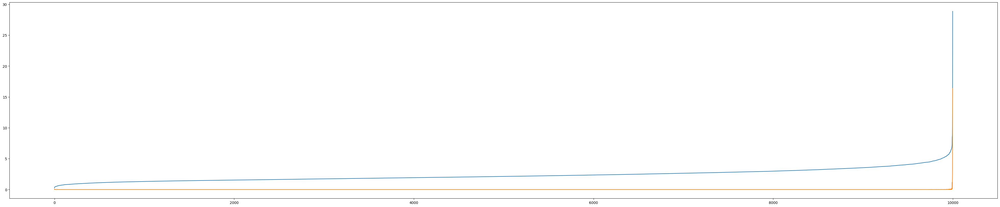

clusters: 2


In [79]:
plt.plot(linkage[:,-2])

acceleration = np.diff(linkage[:,-2], 1)  # 2nd derivative of the distances
acceleration_rev = acceleration[::-1]
plt.plot(acceleration)
plt.show()
k = acceleration_rev.argmax() + 2  # if idx 0 is the max of this we want 2 clusters
print("clusters:", k)

In [78]:
acceleration[-20:]

array([ 2.30969211e-02,  1.74177033e-03, -1.43956368e-02,  3.72706493e-02,
       -1.40898927e-02, -3.55918268e-02,  2.80654039e-02,  2.67349483e-02,
        4.74770517e-02, -4.96324878e-02, -4.37487998e-02,  2.00988916e-01,
       -1.65558888e-01,  2.23983533e-01,  8.90008132e-01, -1.03733842e+00,
        1.64671426e-01,  9.42172997e-01,  1.12022466e+00,  1.40214928e+01])

In [ ]:
sch.dendrogram(linkage, truncate_mode="lastp", p=200, leaf_font_size = 12)

In [60]:
results2

[('ward', 1, 0.46280847390377633),
 ('ward', 2, 0.36904018333460753),
 ('ward', 3, 0.41279241985764786),
 ('ward', 4, 0.3703035595968843),
 ('ward', 5, 0.45598841935393836),
 ('single', 1, 0.5246905581543512),
 ('single', 2, 0.5084913597826768),
 ('single', 3, 0.5164416508819061),
 ('single', 4, 0.5339233959114842),
 ('single', 5, 0.5411633443810341)]

[('centroid', 1, 0.6769007463971969),
 ('centroid', 2, 0.6800860457769555),
 ('centroid', 3, 0.6570822700870587),
 ('centroid', 4, 0.6821060230513547),
 ('centroid', 5, 0.6841910817757164),
 ('average', 1, 0.7033124873105199),
 ('average', 2, 0.6969124022434511),
 ('average', 3, 0.6699911158158645),
 ('average', 4, 0.6828451930973837),
 ('average', 5, 0.7070638807384204)]

In [ ]:
plt.title('Hierarchical Clustering Dendrogram (truncated)')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=12,  # show only the last p merged clusters
    show_leaf_counts=False,  # otherwise numbers in brackets are counts
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
)
plt.show()

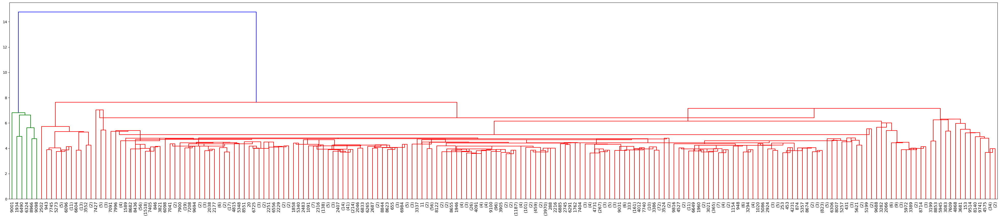

In [52]:
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.dendrogram.html
plt.rcParams['figure.figsize'] = (50.0, 10.0)

plt.show()

In [53]:
from scipy.cluster.hierarchy import cophenet
from scipy.spatial.distance import pdist
#single:5246905581543512, ward:46280847390377633, complete: 4394466596627639, average: 7033124873105199, weighted: 43773164499579126, centroid: 6769007463971969, median:5182783491604638
c, coph_dists = cophenet(linkage, pdist(shape_moments[int((batch_no-1)*10000):int((batch_no)*10000), :]))
c

0.5182783491604638

In [107]:
def calculate_entropy(probs, comps):
    """
    probs : array of data point probability under the components of the mixture model, shape (n_observations, n_components)
    comps : list of indices of components whose entropy is to be calculated
    """
    return -np.nansum(probs.T[comps]*np.log10(probs.T[comps]))

def information_gain(probs, comps):
    """
    probs : array of data point probability under the components of the mixture model, shape (n_observations, n_components)
    comps : two indicies of components within probs whose merger entropy difference is to be calculated
    """
    np.seterr(all = 'ignore') # ignore divide by zero coming from tiny probability values
    seperate_ent = calculate_entropy(probs, comps)
    merged_prob = probs.T[comps[0]]+probs.T[comps[1]]
    merged_ent = -np.nansum(merged_prob*np.log10(merged_prob))
    np.seterr(all = 'warn') 
    return seperate_ent-merged_ent

In [310]:
# probability of data under the original 114 components, and under merged components
probs = np.hstack((shape_moments_GM114_proba, np.zeros((shape_moments_GM114_proba.shape[0], 113)))) # (468202, 227)
# information gain from the merger of each pair of components
# only positions with -1 will need to be calculated (upper triangle of the symmetric matrix)
info_gains = np.ones((227,227))*-1 
info_gains[np.tril_indices(227, k=0, m=None)[0], np.tril_indices(227, k=0, m=None)[1]] = -2. #-2 will be skipped
#number of data points involved in the merger
no_datapoints = np.hstack((component_vol_members_density_df.members.values, np.zeros(113)))

# for keeping track of indices of components that can still be merged
current_comps = list(range(114)) 
merger_history = [] # indices of merged clusters

for merger_ind in range(113):
    merger_ind += 114 # this will be the index of next merged component's column within probability array probs
    for k1 in current_comps:
        for k2 in current_comps: # calculations proceed in rows
            if k1 == k2: continue # skip mergers with self
            if not info_gains[k1,k2] == -1.: continue # only evaluate for -1 (place-holder values)

            info_gains[k1,k2] = information_gain(probs, [k1,k2])
    
    # select the pair of currently available component indices that produces the highest gain value
    sorted_gains = np.argsort(info_gains.flatten())[::-1]# descending list of indices of sorted gain values
    max_gain_pos = np.unravel_index(sorted_gains[0], info_gains.shape)#  
    gain_val_rank = 0
    while (max_gain_pos[0] not in current_comps) or (max_gain_pos[1] not in current_comps):# find top info gain value for existing components
        gain_val_rank+=1
        max_gain_pos = np.unravel_index(sorted_gains[gain_val_rank], info_gains.shape)#(np.where(sorted_gains[gain_val_rank] ==info_gains)[0][0], np.where(sorted_gains[gain_val_rank] ==info_gains)[1][0])#np.unravel_index(sorted_gains[int(gain_val_rank)], info_gains.shape)

    probs[:, merger_ind] = probs[:, max_gain_pos[0]]+probs[:, max_gain_pos[1]] # calculate data probability for the merged component
    merger_history.append(max_gain_pos) # save component indices for this merger 
    
    #remove indices of the merged components from the list and add the component's index
    current_comps.remove(max_gain_pos[0])
    current_comps.remove(max_gain_pos[1])
    current_comps.append(merger_ind)
    
    print(merger_ind-113, "/113 mergers performed")
    clear_output(wait=1)

1 /113 mergers performed
2 /113 mergers performed
3 /113 mergers performed
4 /113 mergers performed
5 /113 mergers performed
6 /113 mergers performed
7 /113 mergers performed
8 /113 mergers performed
9 /113 mergers performed
10 /113 mergers performed
11 /113 mergers performed
12 /113 mergers performed
13 /113 mergers performed
14 /113 mergers performed
15 /113 mergers performed
16 /113 mergers performed
17 /113 mergers performed
18 /113 mergers performed
19 /113 mergers performed
20 /113 mergers performed
21 /113 mergers performed
22 /113 mergers performed
23 /113 mergers performed
24 /113 mergers performed
25 /113 mergers performed
26 /113 mergers performed
27 /113 mergers performed
28 /113 mergers performed
29 /113 mergers performed
30 /113 mergers performed
31 /113 mergers performed
32 /113 mergers performed
33 /113 mergers performed
34 /113 mergers performed
35 /113 mergers performed
36 /113 mergers performed
37 /113 mergers performed
38 /113 mergers performed
39 /113 mergers perfo

In [463]:
np.hstack((component_vol_members_density_df.members.values, np.zeros(113)))

array([ 3095.,  2439.,  1740.,  5177.,  2467.,  8659.,  5940., 17500.,
        2274.,  2913.,  7617.,  3532.,  2650.,  1484.,  6103.,  7195.,
        6547.,  3846.,  2404.,  2955.,  1837.,  2646.,  3613.,  1761.,
        7399.,  1893.,  1233.,  8329., 13291.,  2443.,  1713.,  2870.,
        5934.,  5216.,  1613.,  2055.,  7917.,  8895.,  2998.,  1524.,
        1595.,  2183.,  2532.,  1567.,  6340.,  1787.,  6007.,  1831.,
        2374.,  1745.,  2567.,  2261., 10239.,  5117.,  1683.,  2913.,
        2493., 11636.,  1737.,  1196., 14782.,  2637.,  2498.,  2645.,
        9034.,  1779.,   727.,  5578.,  2421.,  7358.,  1540.,   670.,
        5079.,  3599.,  2012.,  2196.,  6375.,  1696.,  1692.,  3642.,
        3876.,  8085.,  5142.,  6576.,  4925.,  2195.,  2054.,  3225.,
        1250.,  4087.,  5016.,  5652.,  3714.,  4211.,  1897.,  1486.,
        4221.,  2663.,  6556.,  2573.,  4048.,  3715.,  2435.,  6365.,
        2874.,  1909.,  2404.,  1287.,  1026.,  5388.,  1654.,  2087.,
      

In [314]:
component_datapoints = np.zeros(227)
component_datapoints[:114] = component_vol_members_density_df.members.values

In [315]:
for merger_ind, merger in enumerate(merger_history):
    merger_ind+=114
    component_datapoints[merger_ind] = component_datapoints[merger[0]]+component_datapoints[merger[1]]

In [318]:
entropy_diff_per_datap = np.array(chrono_gains)/component_datapoints[-113:]

In [303]:
argsorted_gains = np.argsort(tis_gains.flatten())[::-1]
np.unravel_index(argsorted_gains[0], tis_gains.shape)

(37, 120)

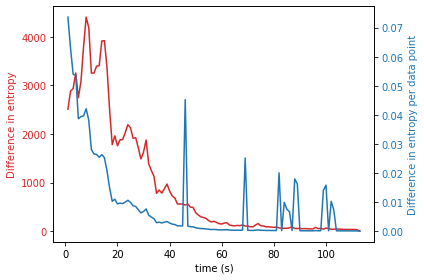

In [362]:
chrono_gains = [info_gains[x,y] for x,y in merger_history]
# plt.plot(np.array(list(range(113)))+1, chrono_gains)
# plt.ylabel("Difference in entropy")
# plt.xlabel("Number of mergers performed")
# plt.show()

# plt.plot(np.array(list(range(113)))+1, entropy_diff_per_datap)
# plt.ylabel("Difference in entropy per data point")
# plt.xlabel("Number of mergers performed")
# plt.show()

fig, ax1 = plt.subplots()
color = 'tab:red'
ax1.set_xlabel('time (s)')
ax1.set_ylabel("Difference in entropy", color=color)
ax1.plot(np.array(list(range(113)))+1, chrono_gains, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel("Difference in entropy per data point", color=color)  # we already handled the x-label with ax1
ax2.plot(np.array(list(range(113)))+1, entropy_diff_per_datap, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [370]:
chrono_gains[38:]

[971.6845145050279,
 828.2750743091833,
 727.1026547321044,
 685.0097691485535,
 563.440685210066,
 560.0107093246838,
 562.2030813836313,
 540.0084117686266,
 561.180119849251,
 497.06637115990407,
 491.8418329645083,
 385.68474524350495,
 335.2486465814377,
 297.66803586914875,
 283.97949429939285,
 265.4820978540722,
 218.97735647981085,
 192.69010156147488,
 205.95547879977016,
 182.26330570697473,
 156.856803083562,
 149.56074381396343,
 169.20173216438639,
 175.60691616047757,
 129.3885878087932,
 117.36477815694093,
 111.49763575087866,
 121.33536147206848,
 116.18203648733731,
 131.45479699655255,
 107.63193756860213,
 107.04994814338613,
 93.60425813750317,
 90.24806671090653,
 131.24490142486707,
 158.87274549174663,
 114.02805636119706,
 109.31846328091501,
 91.69341758610426,
 92.41421817230452,
 85.97847749698292,
 83.78942110540157,
 83.32641926757742,
 71.60711561831167,
 63.50386330159097,
 61.94654363412738,
 62.43688090998998,
 71.9253801376681,
 89.561729348487,
 58.

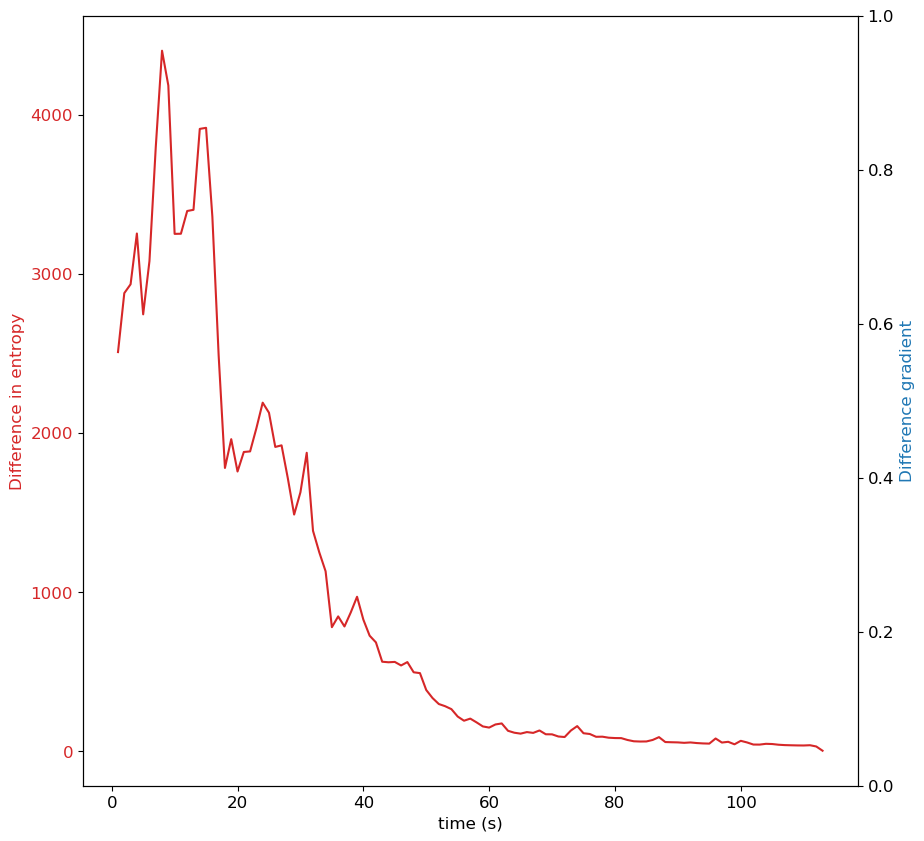

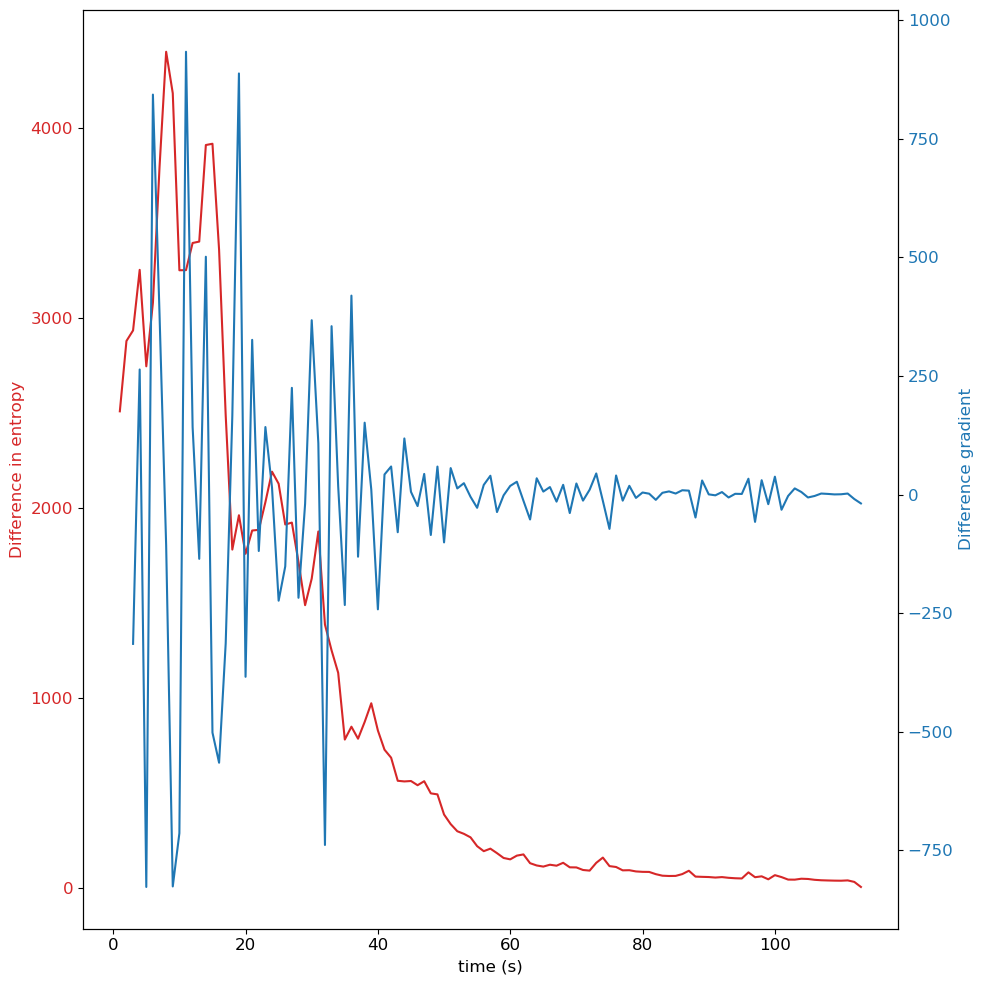

In [336]:
gains_diff = np.diff(chrono_gains, 2)


fig, ax1 = plt.subplots()
color = 'tab:red'
ax1.set_xlabel('time (s)')
ax1.set_ylabel("Difference in entropy", color=color)
ax1.plot(np.array(list(range(113)))+1, chrono_gains, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel("Difference gradient", color=color)  # we already handled the x-label with ax1
ax2.plot(np.array(list(range(111)))+3, gains_diff, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [325]:
for n,m in enumerate(entropy_diff_per_datap):
    print(n,m, merger_history[n])

0 0.07364690934559456 (28, 112)
1 0.063002482901312 (57, 114)
2 0.05399127847339129 (5, 115)
3 0.053578193782260544 (76, 116)
4 0.03869233289210114 (52, 117)
5 0.03941423793884267 (15, 118)
6 0.03967131168882897 (7, 119)
7 0.04210610512854475 (37, 120)
8 0.03812849876451506 (3, 121)
9 0.028072074853610567 (14, 122)
10 0.02657076883767736 (83, 123)
11 0.026367561066605174 (103, 124)
12 0.0254151988819794 (53, 125)
13 0.026308629936495066 (60, 126)
14 0.025275877534148374 (44, 127)
15 0.020690836653705826 (69, 128)
16 0.014804287534541617 (91, 129)
17 0.010259229989707805 (67, 130)
18 0.010983869638909191 (90, 131)
19 0.00937195658009342 (64, 132)
20 0.009634635704792158 (10, 133)
21 0.009457248215327316 (100, 134)
22 0.009996039142735908 (17, 135)
23 0.010610765318851311 (113, 136)
24 0.009923505737757911 (36, 137)
25 0.00875495865526019 (89, 138)
26 0.008477650921884376 (27, 139)
27 0.0073923474856820055 (33, 140)
28 0.0062795692302316 (84, 141)
29 0.006759847727238468 (80, 142)
30 0.0

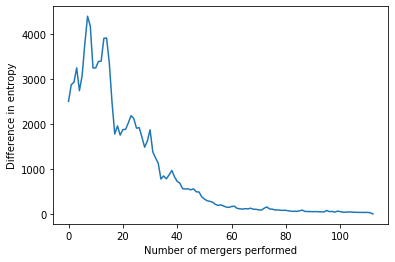

In [363]:
# chrono_gains = [tis_gains[x,y] for x,y in merger_history]
plt.plot(np.array(list(range(113))), chrono_gains)
plt.ylabel("Difference in entropy")
plt.xlabel("Number of mergers performed")
plt.show()

/export/data/jakubok/software/anaconda3/lib/python3.7/site-packages/pwlf/pwlf.py:1109: RuntimeWarning: invalid value encountered in double_scalars
  (self.fit_breaks[i+1]-self.fit_breaks[i])


[ 24.         47.5564942 113.       ]


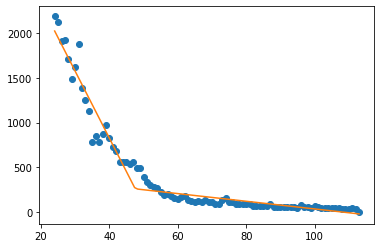

In [364]:
import numpy as np
import matplotlib.pyplot as plt
import pwlf


x = np.array(list(range(113)), dtype=float)[23:]+1
y = np.array(chrono_gains)[23:]

my_pwlf = pwlf.PiecewiseLinFit(x, y)
breaks = my_pwlf.fit(2)
print(breaks)


x_hat = np.linspace(x.min(), x.max(), 100)
y_hat = my_pwlf.predict(x_hat)

plt.figure()
plt.plot(x, y, 'o')
plt.plot(x_hat, y_hat, '-')
plt.show()

[ 39.          56.32294644 113.        ]


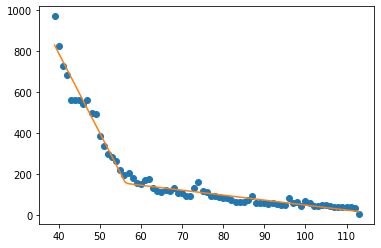

In [371]:
import numpy as np
import matplotlib.pyplot as plt
import pwlf


x = np.array(list(range(113)), dtype=float)[38:]+1
y = np.array(chrono_gains)[38:]

my_pwlf = pwlf.PiecewiseLinFit(x, y)
breaks = my_pwlf.fit(2)
print(breaks)


x_hat = np.linspace(x.min(), x.max(), 100)
y_hat = my_pwlf.predict(x_hat)

plt.figure()
plt.plot(x, y, 'o')
plt.plot(x_hat, y_hat, '-')
plt.show()

[ 46.          56.54539569 113.        ]


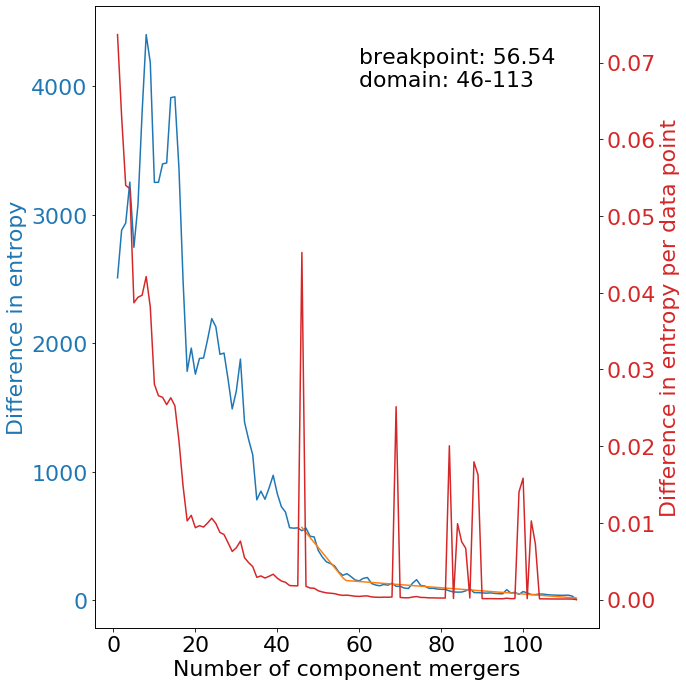

In [398]:
plt.rcParams['figure.figsize'] = (10.0, 10.0)
plt.rcParams.update({'font.size': 22})



chrono_gains = [info_gains[x,y] for x,y in merger_history]

fig, ax1 = plt.subplots()
color = 'tab:blue'
ax1.set_xlabel('Number of component mergers')
ax1.set_ylabel("Difference in entropy", color=color)
ax1.plot(np.array(list(range(113)))+1, chrono_gains, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:red'
ax2.set_ylabel("Difference in entropy per data point", color=color)  # we already handled the x-label with ax1
ax2.plot(np.array(list(range(113)))+1, entropy_diff_per_datap, color=color)
ax2.tick_params(axis='y', labelcolor=color)


x = np.array(list(range(113)), dtype=float)[45:]+1 # 38
y = np.array(chrono_gains)[45:]

my_pwlf = pwlf.PiecewiseLinFit(x, y)
breaks = my_pwlf.fit(2)
print(breaks)


x_hat = np.linspace(x.min(), x.max(), 100)
y_hat = my_pwlf.predict(x_hat)

# plt.plot(x, y, 'o')
ax1.plot(x_hat, y_hat, '-', color="tab:orange")
ax1.text(x=60, y=4000, s="breakpoint: "+str(breaks[1])[:5]+"\ndomain: "+str(int(breaks[0]))+"-"+str(int(breaks[2])))

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()

In [ ]:
starting_components = list(range(114))
merger_state = []
merger_state.append(starting_components)
for merger_no, merger_comps in enumerate(merger_history):
    merger_state.append(merger_state[merger_no])
#     del merger_state[merger_no+1][merger_comps[0]]
#     del merger_state[merger_no+1][merger_comps[1]]
    merger_state[merger_no+1].pop(merger_no, None)
    merger_state[merger_no+1].pop(merger_no, None)
    merged_components = [merger_state[merger_no][merger_comps[0]], merger_state[merger_no][merger_comps[1]]]
    merger_state[merger_no+1][merger_no+114] = [item for sublist in merged_components for item in sublist] # flatten merged_components

In [450]:
import copy

starting_components = list(range(114)) 
merger_state = dict(("merger "+str(merger_no), dict()) for merger_no in list(range(114)))
merger_state["merger 0"]=dict(("cluster "+str(component),[component]) for component in starting_components)
for merger_no, merger_comps in enumerate(merger_history):
    merger_state["merger "+str(merger_no+1)] = copy.deepcopy(merger_state["merger "+str(merger_no)])
    merged_components = copy.deepcopy([merger_state["merger "+str(merger_no+1)]["cluster "+str(merger_comps[0])], merger_state["merger "+str(merger_no+1)]["cluster "+str(merger_comps[1])]])
    del merger_state["merger "+str(merger_no+1)]["cluster "+str(merger_comps[0])]
    del merger_state["merger "+str(merger_no+1)]["cluster "+str(merger_comps[1])]
    merger_state["merger "+str(merger_no+1)]["cluster "+str(merger_no+114)] = [item for sublist in merged_components for item in sublist]
    
#     merger_state[merger_no+1].pop(merger_no, None)
#     merger_state[merger_no+1].pop(merger_no, None)
#     merged_components = [merger_state[merger_no][merger_comps[0]], merger_state[merger_no][merger_comps[1]]]
#     merger_state[merger_no+1][merger_no+114] = [item for sublist in merged_components for item in sublist] # flatten merged_components

In [458]:
merger_history

[(28, 112),
 (57, 114),
 (5, 115),
 (76, 116),
 (52, 117),
 (15, 118),
 (7, 119),
 (37, 120),
 (3, 121),
 (14, 122),
 (83, 123),
 (103, 124),
 (53, 125),
 (60, 126),
 (44, 127),
 (69, 128),
 (91, 129),
 (67, 130),
 (90, 131),
 (64, 132),
 (10, 133),
 (100, 134),
 (17, 135),
 (113, 136),
 (36, 137),
 (89, 138),
 (27, 139),
 (33, 140),
 (84, 141),
 (80, 142),
 (72, 143),
 (24, 144),
 (46, 145),
 (11, 146),
 (32, 147),
 (6, 148),
 (93, 149),
 (81, 150),
 (98, 151),
 (0, 152),
 (9, 153),
 (96, 154),
 (55, 155),
 (92, 156),
 (29, 157),
 (16, 109),
 (158, 159),
 (101, 160),
 (87, 161),
 (1, 162),
 (41, 163),
 (35, 164),
 (8, 165),
 (70, 166),
 (99, 167),
 (21, 168),
 (73, 169),
 (48, 170),
 (104, 171),
 (4, 172),
 (79, 173),
 (42, 174),
 (40, 175),
 (82, 176),
 (106, 177),
 (61, 178),
 (68, 179),
 (75, 180),
 (30, 50),
 (19, 181),
 (13, 183),
 (12, 184),
 (182, 185),
 (110, 186),
 (38, 187),
 (23, 188),
 (97, 189),
 (86, 190),
 (111, 191),
 (65, 192),
 (94, 193),
 (2, 47),
 (107, 194),
 (22,

In [459]:
merger_state["merger 57"]

{'cluster 2': [2],
 'cluster 4': [4],
 'cluster 12': [12],
 'cluster 13': [13],
 'cluster 18': [18],
 'cluster 19': [19],
 'cluster 20': [20],
 'cluster 22': [22],
 'cluster 23': [23],
 'cluster 25': [25],
 'cluster 26': [26],
 'cluster 30': [30],
 'cluster 31': [31],
 'cluster 34': [34],
 'cluster 38': [38],
 'cluster 39': [39],
 'cluster 40': [40],
 'cluster 42': [42],
 'cluster 43': [43],
 'cluster 45': [45],
 'cluster 47': [47],
 'cluster 48': [48],
 'cluster 49': [49],
 'cluster 50': [50],
 'cluster 51': [51],
 'cluster 54': [54],
 'cluster 56': [56],
 'cluster 58': [58],
 'cluster 59': [59],
 'cluster 61': [61],
 'cluster 62': [62],
 'cluster 63': [63],
 'cluster 65': [65],
 'cluster 66': [66],
 'cluster 68': [68],
 'cluster 71': [71],
 'cluster 74': [74],
 'cluster 75': [75],
 'cluster 77': [77],
 'cluster 78': [78],
 'cluster 79': [79],
 'cluster 82': [82],
 'cluster 85': [85],
 'cluster 86': [86],
 'cluster 88': [88],
 'cluster 94': [94],
 'cluster 95': [95],
 'cluster 97': [9

In [418]:
merger_state[1]

[]

In [471]:
for merger_key,merger_vals in merger_state.items():
    # count number of components that make up each cluster, then find how common the counts are
    no_unique_component_counts = np.unique([len(comp_vals) for comp_key, comp_vals in merger_vals.items()], return_counts=True) 
    print(merger_key,"\tnumber of clusters: ", len(merger_vals),"\t sizes of clusters, number of each size of cluster", no_unique_component_counts)

merger 0 	number of clusters:  114 	 sizes of clusters, number of each size of cluster (array([1]), array([114]))
merger 1 	number of clusters:  113 	 sizes of clusters, number of each size of cluster (array([1, 2]), array([112,   1]))
merger 2 	number of clusters:  112 	 sizes of clusters, number of each size of cluster (array([1, 3]), array([111,   1]))
merger 3 	number of clusters:  111 	 sizes of clusters, number of each size of cluster (array([1, 4]), array([110,   1]))
merger 4 	number of clusters:  110 	 sizes of clusters, number of each size of cluster (array([1, 5]), array([109,   1]))
merger 5 	number of clusters:  109 	 sizes of clusters, number of each size of cluster (array([1, 6]), array([108,   1]))
merger 6 	number of clusters:  108 	 sizes of clusters, number of each size of cluster (array([1, 7]), array([107,   1]))
merger 7 	number of clusters:  107 	 sizes of clusters, number of each size of cluster (array([1, 8]), array([106,   1]))
merger 8 	number of clusters:  1

In [330]:
plt.close()

plt.rcParams['figure.figsize'] = (10,10)
plt.rcParams.update({'font.size': 12})

counts = np.unique(shape_moments_GM114_labels, return_counts=1)

counts_todo = [158, 159]


how_many_to_plot = 10
for ind, new_class in enumerate(counts[0][np.argsort(counts[1])[::-1]]):
    if new_class not in counts_todo: continue
    class_segments = np.where(shape_moments_GM114_labels == new_class)[0]
    fig, axes = plt.subplots(nrows=how_many_to_plot, ncols=2)
    
    for subplot in range(how_many_to_plot):
        data = segments_counts[class_segments[subplot]]
        reconstruction = segment_reconstructions[class_segments[subplot]]
        axes[subplot, 0].plot(np.array(list(range(128)))*4,segments_counts[class_segments[subplot]])#, c="green", linewidth=0.5, zorder=-5)
        axes[subplot, 0].plot(np.array(list(range(128)))*4, reconstruction*np.std(data)+np.mean(data))
        axes[subplot, 1].plot(np.array(list(range(128)))*4,segments_counts[class_segments[subplot]])
        axes[subplot, 1].plot(np.array(list(range(128)))*4, reconstruction*np.std(data)+np.mean(data))
        axes[subplot, 1].set_ylim([0, 13000])
    plt.suptitle("class {}, population {}".format(new_class, np.sort(counts[1])[::-1][ind]), y=1.01)
    plt.tight_layout()
    plt.show()
